#COVID-19 Mortality Prediction on synthetic data

Predicting mortality for patients admitted to the hospital having been diagnosed with COVID-19.

##Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
import datetime

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Data Acquisition and Prep for Analysis

Download files from https://mitre.box.com/shared/static/wk3560f962ozlg7sd2oj1zxk73ayqvm0.zip and save onto Google drive

Data is based on 100,000 synthetic patients records with COVID-19

Acknowledgements

SyntheaTM COVID-19 data:

Walonoski J, Klaus S, Granger E, Hall D, Gregorowicz A, Neyarapally G, Watson A, Eastman J. Synthea™ Novel coronavirus (COVID-19) model and synthetic data set. Intelligence-Based Medicine. 2020 Nov;1:100007. https://doi.org/10.1016/j.ibmed.2020.100007

SyntheaTM / SyntheticMass:

Jason Walonoski, Mark Kramer, Joseph Nichols, Andre Quina, Chris Moesel, Dylan Hall, Carlton Duffett, Kudakwashe Dube, Thomas Gallagher, Scott McLachlan, Synthea: An approach, method, and software mechanism for generating synthetic patients and the synthetic electronic health care record, Journal of the American Medical Informatics Association, Volume 25, Issue 3, March 2018, Pages 230–238, https://doi.org/10.1093/jamia/ocx079

In [3]:
conditions    = pd.read_csv('drive/MyDrive/AIHealthTutorial/Online/Final_Project/conditions.csv')
patients      = pd.read_csv('drive/MyDrive/AIHealthTutorial/Online/Final_Project/patients.csv')
observations  = pd.read_csv('drive/MyDrive/AIHealthTutorial/Online/Final_Project/observations.csv')
care_plans    = pd.read_csv('drive/MyDrive/AIHealthTutorial/Online/Final_Project/careplans.csv')
encounters    = pd.read_csv('drive/MyDrive/AIHealthTutorial/Online/Final_Project/encounters.csv')
procedures    = pd.read_csv('drive/MyDrive/AIHealthTutorial/Online/Final_Project/procedures.csv')

In [4]:
#get the code for COVID-19
covid_code = conditions.loc[conditions['DESCRIPTION'] == 'COVID-19', 'CODE'].values[0]
covid_code

840539006

In [5]:
#get the observation code for COVID-19
obs_code = observations.loc[observations['DESCRIPTION'] == 'SARS-CoV-2 RNA Pnl Resp NAA+probe', 'CODE'].values[0]
obs_code

'94531-1'

In [6]:
#get the care plan code for COVID-19
care_code = care_plans.loc[care_plans['REASONDESCRIPTION'] == 'COVID-19', 'CODE'].values[0]
care_code

736376001

In [7]:
#get the encounter code for COVID-19 admissions
enctr_code = encounters.loc[encounters['REASONDESCRIPTION'] == 'COVID-19', 'CODE'].values[0]
enctr_code

1505002

In [88]:
#Grab the IDs of patients that have been diagnosed with COVID-19
covid_patient_ids = conditions[conditions.CODE == covid_code].PATIENT.unique()

#Grab every patient with a negative SARS-CoV-2 test. This will include patients who tested negative up front as well as patients that tested negative after leaving the hospital
negative_covid_patient_ids = observations[(observations.CODE == obs_code) & (observations.VALUE == 'Not detected (qualifier value)')].PATIENT.unique()

#Grabs IDs for all patients that died in the simulation. This will be more than just COVID-19 deaths.
deceased_patients = patients[patients.DEATHDATE.notna()].Id

#Grabs IDs for patients that have completed the care plan for isolation at home.
completed_isolation_patients = care_plans[(care_plans.CODE == care_code) & (care_plans.STOP.notna()) & (care_plans.REASONCODE == covid_code)].PATIENT

#Survivors are the union of those who have completed isolation at home or have a negative SARS-CoV-2 test.
survivor_ids = np.union1d(completed_isolation_patients, negative_covid_patient_ids)

#Grab IDs for patients with admission due to COVID-19
inpatient_ids = encounters[(encounters.REASONCODE == covid_code) & (encounters.CODE == enctr_code)].PATIENT

#The number of inpatient survivors
print('Dataset has {} number of inpatient survivors.'.format(len(np.intersect1d(inpatient_ids, survivor_ids))))

#The number of inpatient non-survivors
print('Dataset has {} number of inpatient deaths.'.format(len(np.intersect1d(inpatient_ids, deceased_patients))))


Dataset has 14654 number of inpatient survivors.
Dataset has 3548 number of inpatient deaths.


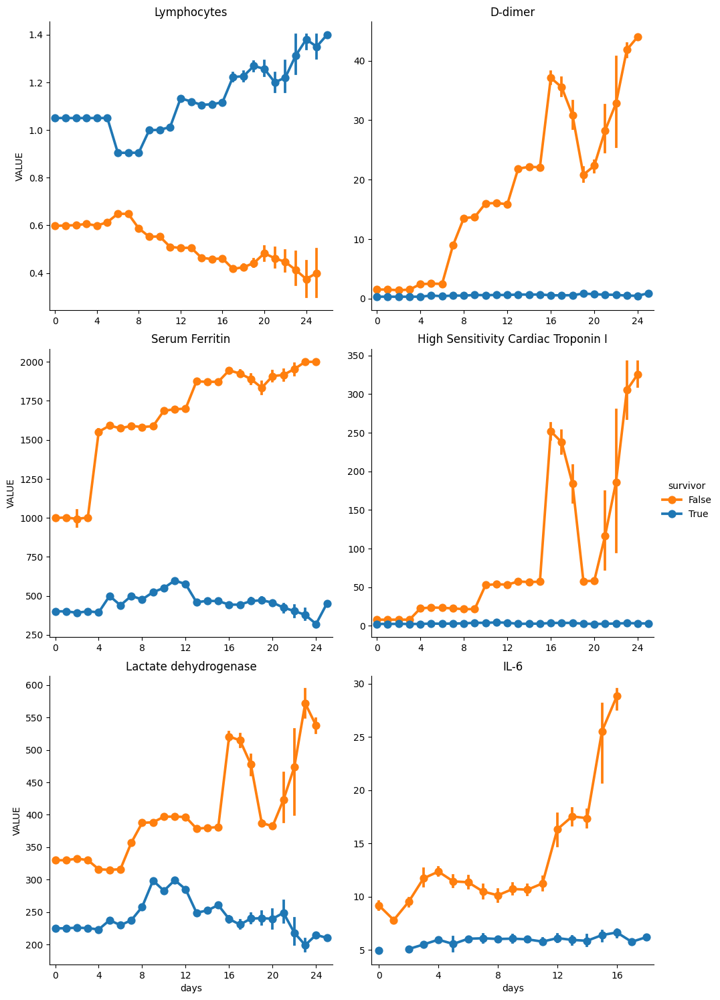

In [89]:
#Lab values for COVID-19 patients to be used in assessing patient mortality
#Select lab values of interest from all observations in the simulation.
lab_obs = observations[   (observations.CODE == '48065-7') | (observations.CODE == '26881-3') |
                          (observations.CODE == '2276-4')  | (observations.CODE == '89579-7') |
                          (observations.CODE == '731-0')   | (observations.CODE == '14804-9')
                      ]
#Select COVID-19 conditions out of all conditions in the simulation
covid_conditions = conditions[conditions.CODE == covid_code]

#Merge the COVID-19 conditions with the patients
covid_patients = covid_conditions.merge(patients, how='left', left_on='PATIENT', right_on='Id')

#Add an attribute to the DataFrame indicating whether this is a survivor or not.
covid_patients['survivor'] = covid_patients.PATIENT.isin(survivor_ids)

#Reduce the columns on the DataFrame to ones needed
covid_patients = covid_patients[['START', 'PATIENT', 'survivor', 'CODE']]

#Calculate attributes needed to support the plot. Also coerce all lab values into a numeric data type.
covid_patients_obs = covid_patients.merge(lab_obs, on='PATIENT')
covid_patients_obs['START'] = pd.to_datetime(covid_patients_obs.START)
covid_patients_obs['DATE'] = pd.to_datetime(covid_patients_obs.DATE)
covid_patients_obs['lab_days'] = covid_patients_obs.DATE - covid_patients_obs.START
covid_patients_obs['days'] = covid_patients_obs.lab_days / np.timedelta64(1, 'D')
covid_patients_obs['VALUE'] = pd.to_numeric(covid_patients_obs['VALUE'], errors='coerce')

loinc_to_display = {'CODE_y = 48065-7': 'D-dimer', 'CODE_y = 2276-4': 'Serum Ferritin',
                    'CODE_y = 89579-7': 'High Sensitivity Cardiac Troponin I',
                    'CODE_y = 26881-3': 'IL-6', 'CODE_y = 731-0': 'Lymphocytes',
                    'CODE_y = 14804-9': 'Lactate dehydrogenase'
                    }

catplt = sns.catplot(x="days", y="VALUE", hue="survivor", kind="point", col='CODE_y',
            col_wrap=2, sharey=False, sharex=False, data=covid_patients_obs, palette=["C1", "C0"])

for axis in catplt.fig.axes:
    axis.xaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
    axis.xaxis.set_major_locator(ticker.MultipleLocator(base=4))
    axis.set_title(loinc_to_display[axis.title.get_text()])

plt.show()

With visual inspection of the above charts, we can determine break points between patient survival and mortality for future use.

D-dimer: 5

Serum Ferritin: 750

High Sensitivity Cardiac Troponin I: 20

IL-6: 8

Lymphocytes: 0.80

Lactate dehydrogenase: 300

In [90]:
#set thresholds
dimer_threshold     = 5
ferritin_threshold  = 750
hsct_threshold      = 20
ilsix_threshold     = 8
lymph_threshold     = 0.8
lactate_threshold   = 300

In [91]:
#check survival and death cases to see if any fall outside of the thresholds. All values should be zero.
#'CODE_y = 48065-7': 'D-dimer'
#'CODE_y = 2276-4': 'Serum Ferritin',
#'CODE_y = 89579-7': 'High Sensitivity Cardiac Troponin I'
#'CODE_y = 26881-3': 'IL-6'
#'CODE_y = 731-0': 'Lymphocytes'
#'CODE_y = 14804-9': 'Lactate dehydrogenase'

print('For patients who survived:')

count_above_threshold = ((covid_patients_obs['CODE_y'] == '48065-7') & (covid_patients_obs['VALUE'] > dimer_threshold) & (covid_patients_obs['survivor'] == 'True')).sum()
print('There are {} above the D-dimer threshold'.format(count_above_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '2276-4') & (covid_patients_obs['VALUE'] > ferritin_threshold) & (covid_patients_obs['survivor'] == 'True')).sum()
print('There are {} above the Serum Ferritin threshold'.format(count_above_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '89579-7') & (covid_patients_obs['VALUE'] > hsct_threshold) & (covid_patients_obs['survivor'] == 'True')).sum()
print('There are {} above the High Sensitivity Cardiac Troponin I threshold'.format(count_above_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '26881-3') & (covid_patients_obs['VALUE'] > ilsix_threshold) & (covid_patients_obs['survivor'] == 'True')).sum()
print('There are {} above the IL-6 threshold'.format(count_above_threshold))

count_below_threshold = ((covid_patients_obs['CODE_y'] == '731-0') & (covid_patients_obs['VALUE'] < lymph_threshold) & (covid_patients_obs['survivor'] == 'True')).sum()
print('There are {} below the Lymphocytes threshold noting that low lymphocytes reflect low white blood cells critical for the immune system '.format(count_below_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '14804-9') & (covid_patients_obs['VALUE'] > lactate_threshold) & (covid_patients_obs['survivor'] == 'True')).sum()
print('There are {} above the Lactate dehydrogenase threshold'.format(count_above_threshold))

print('')
print('For patients who died:')

count_above_threshold = ((covid_patients_obs['CODE_y'] == '48065-7') & (covid_patients_obs['VALUE'] <= dimer_threshold) & (covid_patients_obs['survivor'] == 'False')).sum()
print('There are {} below the D-dimer threshold'.format(count_above_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '2276-4') & (covid_patients_obs['VALUE'] <= ferritin_threshold) & (covid_patients_obs['survivor'] == 'False')).sum()
print('There are {} below the Serum Ferritin threshold'.format(count_above_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '89579-7') & (covid_patients_obs['VALUE'] <= hsct_threshold) & (covid_patients_obs['survivor'] == 'False')).sum()
print('There are {} below the High Sensitivity Cardiac Troponin I threshold'.format(count_above_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '26881-3') & (covid_patients_obs['VALUE'] <= ilsix_threshold) & (covid_patients_obs['survivor'] == 'False')).sum()
print('There are {} below the IL-6 threshold'.format(count_above_threshold))

count_below_threshold = ((covid_patients_obs['CODE_y'] == '731-0') & (covid_patients_obs['VALUE'] >= lymph_threshold) & (covid_patients_obs['survivor'] == 'False')).sum()
print('There are {} above the Lymphocytes threshold noting that low lymphocytes reflect low white blood cells critical for the immune system'.format(count_below_threshold))

count_above_threshold = ((covid_patients_obs['CODE_y'] == '14804-9') & (covid_patients_obs['VALUE'] <= lactate_threshold) & (covid_patients_obs['survivor'] == 'False')).sum()
print('There are {} below the Lactate dehydrogenase threshold'.format(count_above_threshold))


For patients who survived:
There are 0 above the D-dimer threshold
There are 0 above the Serum Ferritin threshold
There are 0 above the High Sensitivity Cardiac Troponin I threshold
There are 0 above the IL-6 threshold
There are 0 below the Lymphocytes threshold noting that low lymphocytes reflect low white blood cells critical for the immune system 
There are 0 above the Lactate dehydrogenase threshold

For patients who died:
There are 0 below the D-dimer threshold
There are 0 below the Serum Ferritin threshold
There are 0 below the High Sensitivity Cardiac Troponin I threshold
There are 0 below the IL-6 threshold
There are 0 above the Lymphocytes threshold noting that low lymphocytes reflect low white blood cells critical for the immune system
There are 0 below the Lactate dehydrogenase threshold


###Creating the dataframes for analysis

In [92]:
#Set up a new DataFrame with boolean columns representing various outcomes, like admit, recovery or death
cp = covid_conditions.merge(patients, how='left', left_on='PATIENT', right_on='Id')
isolation_ids = care_plans[(care_plans.CODE == care_code) & (care_plans.REASONCODE == covid_code)].PATIENT
cp['isolation'] = cp.Id.isin(isolation_ids)
cp['admit'] = cp.Id.isin(inpatient_ids)
cp['recovered'] = cp.Id.isin(survivor_ids)
cp['death'] = cp.DEATHDATE.notna()
icu_ids = encounters[encounters.CODE == 305351004].PATIENT
cp['icu_admit'] = cp.Id.isin(icu_ids)
vent_ids = procedures[procedures.CODE == 26763009].PATIENT
cp['ventilated'] = cp.Id.isin(vent_ids)

In [93]:
#Outcomes for all COVID-19 Patients
#This DataFrame contains the percentages of patients that either recovered or passed away.

hospitalized = (cp.admit == True)
icu = (cp.icu_admit == True)
vent = (cp.ventilated == True)
covid_count = cp.Id.size
row_filters = {'Recovered': (cp.recovered == True), 'Death': (cp.death == True)}

table_rows = []
for category, row_filter in row_filters.items():
    row = {'Outcome': category}
    row['All Patients'] = cp[row_filter].Id.size / covid_count
    row['Hospitalized'] = cp[row_filter & hospitalized].Id.size / hospitalized.value_counts()[True]
    row['ICU Admitted'] = cp[row_filter & icu].Id.size / icu.value_counts()[True]
    row['Required Ventilation'] = cp[row_filter & vent].Id.size / vent.value_counts()[True]
    table_rows.append(row)

pd.DataFrame.from_records(table_rows)


,Outcome,All Patients,Hospitalized,ICU Admitted,Required Ventilation
0,Recovered,0.959724,0.806272,0.320914,0.14825
1,Death,0.041297,0.195103,0.679358,0.85175


For those patients that died, ICU admittance and ventilation have relatively higher percentages than those that survived.

In [94]:
#Start to build a DataFrame that we can use to look at other conditions in relation to COVID-19
covid_info = cp[['PATIENT', 'recovered', 'death', 'START', 'DEATHDATE', 'BIRTHDATE', 'GENDER', 'admit', 'icu_admit']]
covid_info = covid_info.rename(columns={'START': 'covid_start'})

#Grab all of the conditions starting after January 20, 2020. This is a hack to get only conditions that are related to COVID-19. We will end up merging these with the COVID patients.
covid_related_conditions = conditions[pd.to_datetime(conditions.START) > pd.to_datetime('2020-01-20')]

#This DataFrame will contain all conditions for COVID-19 patients, where START can be compared to covid_start to see how long after the COVID-19 diagnosis something happened.
covid_patient_conditions = covid_info.merge(covid_related_conditions, on='PATIENT')

In [95]:
#Symptoms for ICU admitted COVID-19 Patients
#Create a DataFrame with columns that show a condition's start and end in days relative to COVID-19 diagnosis. Also create a column that calculates the number of days between COVID-19 diagnosis and a person's death.

covid_patient_conditions['start_days'] = (pd.to_datetime(covid_patient_conditions.START) - pd.to_datetime(covid_patient_conditions.covid_start)) / np.timedelta64(1, 'D')
covid_patient_conditions['end_days'] = (pd.to_datetime(covid_patient_conditions.STOP) - pd.to_datetime(covid_patient_conditions.covid_start)) / np.timedelta64(1, 'D')
covid_patient_conditions['death_days'] = (pd.to_datetime(covid_patient_conditions.DEATHDATE) - pd.to_datetime(covid_patient_conditions.covid_start)) / np.timedelta64(1, 'D')

In [96]:
#Add an age column to the DataFrame for rows where the patient has died
covid_info.loc[covid_info.death == True, 'age'] = (pd.to_datetime(covid_info.DEATHDATE) - pd.to_datetime(covid_info.BIRTHDATE)) / np.timedelta64(1, 'Y')

#Populate ages for survivors based on the current date
covid_info.loc[covid_info.recovered == True, 'age'] = (datetime.datetime.now() - pd.to_datetime(covid_info.BIRTHDATE)) / np.timedelta64(1, 'Y')

#Create an age_range column that places individuals into 10 year age ranges, such as 0 - 10, 10 - 20, etc.

bins = list(range(0, 120, 10))
covid_info['age_range'] = pd.cut(covid_info.age, bins=bins)

<ipython-input-97-ffe73b03defb>:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



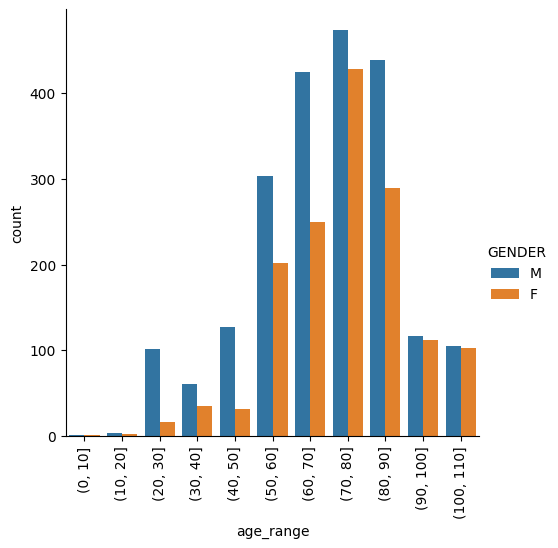

In [97]:
#Mortality by Age and Sex
#A plot of deaths grouped by age range and gender.

chart = sns.catplot(x="age_range", kind="count", hue="GENDER", data=covid_info[covid_info.death==True]);
for axes in chart.axes.flat:
    axes.set_xticklabels(axes.get_xticklabels(), rotation=90)

Let's clean up and create a dataframe for our model.

In [98]:
#Create a new column for length of stay/hospitalization for survivors and days until death for those who died

# Define a custom function to calculate the maximum value relative to the difference between two columns
def calculate_max(col1_val, col2_val, col3_val):
    return max(col1_val, col2_val - col3_val)

# Apply the custom function to create a new column
covid_patient_conditions['death_days'].fillna(0, inplace=True)
covid_patient_conditions['LOS'] = covid_patient_conditions.apply(lambda row: calculate_max(row['death_days'], row['end_days'], row['start_days']), axis=1)

covid_patient_conditions.iloc[:,[0,17]]

,PATIENT,LOS
0,1ff7f10f-a204-4bb1-aa72-dd763fa99482,29.0
1,1ff7f10f-a204-4bb1-aa72-dd763fa99482,0.0
2,1ff7f10f-a204-4bb1-aa72-dd763fa99482,29.0
3,9bcf6ed5-d808-44af-98a0-7d78a29ede72,14.0
4,9bcf6ed5-d808-44af-98a0-7d78a29ede72,32.0
...,...,...
643449,503d768f-481c-46e2-bcdb-a6116686351a,13.0
643450,f8d85cff-037c-4313-9448-14ac57d586a8,27.0
643451,f8d85cff-037c-4313-9448-14ac57d586a8,27.0
643452,f8d85cff-037c-4313-9448-14ac57d586a8,0.0


In [99]:
#Create a dataframe of smoking status
smoker_df = pd.DataFrame()
smoker_df = observations[observations['DESCRIPTION'] == 'Tobacco smoking status NHIS']
smoker_df.rename(columns={'VALUE': 'smoker'}, inplace=True)

smoker_df.iloc[:,[1,5]]

<ipython-input-99-ae2cb3a0fa9b>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,PATIENT,smoker
9,1ff7f10f-a204-4bb1-aa72-dd763fa99482,Never smoker
21,1ff7f10f-a204-4bb1-aa72-dd763fa99482,Never smoker
53,9bcf6ed5-d808-44af-98a0-7d78a29ede72,Never smoker
65,9bcf6ed5-d808-44af-98a0-7d78a29ede72,Never smoker
107,5163c501-353c-4a82-b863-a3f1df2d6cf1,Never smoker
...,...,...
16218938,1ecfda69-7afc-4417-8a6f-c00be1be96dc,Former smoker
16218992,8cf835a7-f161-4fe9-a559-350c97a3450e,Never smoker
16219054,503d768f-481c-46e2-bcdb-a6116686351a,Never smoker
16219892,2599e9d9-ca59-44ec-a28c-9eae219f162d,Never smoker


In [115]:
#Create a dataframe of body mass index
bmi_df = pd.DataFrame()
bmi_df = observations[observations['DESCRIPTION'] == 'Body Mass Index']
bmi_df.rename(columns={'VALUE': 'BMI'}, inplace=True)

# Convert the 'BMI' column to integer
bmi_df['BMI'] = bmi_df['BMI'].astype(float)
bmi_df['BMI'] = bmi_df['BMI'].astype(int)

bmi_df.iloc[:,[1,5]]

<ipython-input-115-811aacccfd69>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-115-811aacccfd69>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-115-811aacccfd69>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,PATIENT,BMI
15,1ff7f10f-a204-4bb1-aa72-dd763fa99482,16
47,9bcf6ed5-d808-44af-98a0-7d78a29ede72,16
59,9bcf6ed5-d808-44af-98a0-7d78a29ede72,16
90,5163c501-353c-4a82-b863-a3f1df2d6cf1,23
128,5163c501-353c-4a82-b863-a3f1df2d6cf1,23
...,...,...
16218925,1ecfda69-7afc-4417-8a6f-c00be1be96dc,27
16218979,8cf835a7-f161-4fe9-a559-350c97a3450e,28
16219037,503d768f-481c-46e2-bcdb-a6116686351a,27
16219887,2599e9d9-ca59-44ec-a28c-9eae219f162d,27


In [116]:
#merge multiple dataframes into our analysis dataframe
cpobs_short = covid_patients_obs.iloc[:,[1,6,8]]
cp_short = cp.iloc[:,[2, 31, 36]]
ccond_short = covid_patient_conditions.iloc[:,[0,17]]
smoker_short = smoker_df.iloc[:,[1,5]]
bmi_short = bmi_df.iloc[:,[1,5]]

covid_df = pd.DataFrame()
covid_df = pd.merge(covid_patients, covid_info, on='PATIENT')
covid_df = pd.merge(covid_df, cpobs_short, on='PATIENT')
covid_df = pd.merge(covid_df, cp_short, on='PATIENT')
covid_df = pd.merge(covid_df, ccond_short, on='PATIENT')
covid_df = pd.merge(covid_df, smoker_short, on='PATIENT')
covid_df = pd.merge(covid_df, bmi_short, on='PATIENT')
covid_df.head(2)

,START,PATIENT,survivor,CODE,recovered,death,covid_start,DEATHDATE,BIRTHDATE,GENDER,...,icu_admit,age,age_range,CODE_y,VALUE,isolation,ventilated,LOS,smoker,BMI
0,2020-03-07,3c3b89b1-cb41-4f94-9193-2f3da4fe38e5,True,840539006,True,False,2020-03-07,NaN,1983-09-30,F,...,False,40.587839,"(40, 50]",731-0,1.0,False,False,13.0,Never smoker,28
1,2020-03-07,3c3b89b1-cb41-4f94-9193-2f3da4fe38e5,True,840539006,True,False,2020-03-07,NaN,1983-09-30,F,...,False,40.587839,"(40, 50]",731-0,1.0,False,False,13.0,Never smoker,28


In [117]:
#Convert the text to numbers for use in machine learning
#CODE_y = 48065-7:   D-dimer
#CODE_y = 2276-4:    Serum Ferritin
#CODE_y = 89579-7:   High Sensitivity Cardiac Troponin I
#CODE_y = 26881-3:   IL-6
#CODE_y = 731-0:     Lymphocytes
#CODE_y = 14804-9:   Lactate dehydrogenase


#create new columns by converting text-based variables to integers and lab-item specific columns for their values
covid_df['death']                     = covid_df['death'].replace({True: 1, False: 0})
covid_df['admit']                     = covid_df['admit'].replace({True: 1, False: 0})
covid_df['icu_admit']                 = covid_df['icu_admit'].replace({True: 1, False: 0})
covid_df['isolation']                 = covid_df['isolation'].replace({True: 1, False: 0})
covid_df['ventilated']                = covid_df['ventilated'].replace({True: 1, False: 0})
covid_df['is_male']                   = covid_df['GENDER'].apply(lambda x: 1 if x == 'M' else 0)
covid_df['d_dimer']                   = covid_df['CODE_y'].apply(lambda x: 1 if x == '48065-7' else 0) * covid_df['VALUE']
covid_df['serum_ferritin']            = covid_df['CODE_y'].apply(lambda x: 1 if x == '2276-4' else 0) * covid_df['VALUE']
covid_df['hi_sens_card_trop']         = covid_df['CODE_y'].apply(lambda x: 1 if x == '89579-7' else 0) * covid_df['VALUE']
covid_df['il_six']                    = covid_df['CODE_y'].apply(lambda x: 1 if x == '26881-3' else 0) * covid_df['VALUE']
covid_df['lymphocytes']               = covid_df['CODE_y'].apply(lambda x: 1 if x == '731-0' else 0) * covid_df['VALUE']
covid_df['lactate_dehydrogenase']     = covid_df['CODE_y'].apply(lambda x: 1 if x == '14804-9' else 0) * covid_df['VALUE']

#adjust smoker column from text to numbers
def change_smoker(x):
    if x == 'Never smoker':
        return 0
    elif x == 'Former smoker': #for former smokers we will use 0.5 to differentiate from current and non-smokers
        return 0.5
    else:
        return 1 #current smokers will be 1
covid_df['smoker'] = covid_df['smoker'].apply(change_smoker)

#Clean up and drop unnecessary columns
covid_df = covid_df.drop(columns=['survivor'])
covid_df = covid_df.drop(columns=['admit']) #drop hospital admission as all patients in this sample were admitted
covid_df = covid_df.drop(columns=['DEATHDATE'])
covid_df = covid_df.drop(columns=['BIRTHDATE'])
covid_df = covid_df.drop(columns=['age_range'])
covid_df = covid_df.drop(columns=['GENDER'])
covid_df = covid_df.drop(columns=['START'])
covid_df = covid_df.drop(columns=['recovered'])
covid_df = covid_df.drop(columns=['covid_start'])
covid_df = covid_df.drop(columns=['CODE_y'])
covid_df = covid_df.drop(columns=['VALUE'])
covid_df = covid_df.drop(columns=['CODE'])

covid_df.head(2)

,PATIENT,death,icu_admit,age,isolation,ventilated,LOS,smoker,BMI,is_male,d_dimer,serum_ferritin,hi_sens_card_trop,il_six,lymphocytes,lactate_dehydrogenase
0,3c3b89b1-cb41-4f94-9193-2f3da4fe38e5,0,0,40.587839,0,0,13.0,0.0,28,0,0.0,0.0,0.0,0.0,1.0,0.0
1,3c3b89b1-cb41-4f94-9193-2f3da4fe38e5,0,0,40.587839,0,0,13.0,0.0,28,0,0.0,0.0,0.0,0.0,1.0,0.0


In [118]:
#combine rows by patient using the maximum value of each variable
covid_df = covid_df.groupby('PATIENT').max()

#save dataframe for use in regression
covid_df_reg = pd.DataFrame()
covid_df_reg = covid_df

#remove the patient indexing for future ease of use
reset_covid_df_reg = pd.DataFrame()
reset_covid_df_reg = covid_df_reg.reset_index()
reset_covid_df_reg = reset_covid_df_reg.drop(columns=['PATIENT'])

reset_covid_df_reg.head(2)

,death,icu_admit,age,isolation,ventilated,LOS,smoker,BMI,is_male,d_dimer,serum_ferritin,hi_sens_card_trop,il_six,lymphocytes,lactate_dehydrogenase
0,0,0,65.431674,0,0,13.0,0.0,27,0,0.6,633.3,5.0,0.0,1.2,324.1
1,0,0,40.300167,0,0,11.0,0.0,37,0,0.6,533.0,4.1,0.0,1.1,294.8


###Balance Data

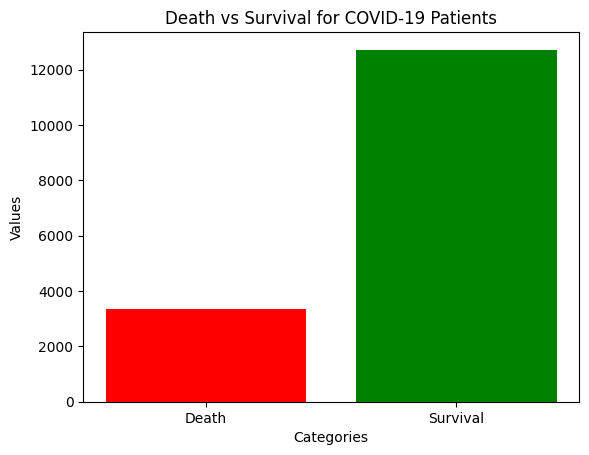

In [119]:
#check the data for balance
import matplotlib.pyplot as plt

# Data
labels = ['Death', 'Survival']
values = [reset_covid_df_reg['death'].value_counts()[1], reset_covid_df_reg['death'].value_counts()[0]]

# Create a bar plot
plt.bar(labels, values, color=['red', 'green'])
plt.xlabel('Categories')
plt.ylabel('Values')
plt.title('Death vs Survival for COVID-19 Patients')
plt.show()

In [120]:
#Balancing the class distribution using undersampling.
# Count the occurrences of each class
class_counts = reset_covid_df_reg['death'].value_counts()

# Find the minority class label (1 in this case)
minority_class = class_counts.idxmin()

# Calculate the number of samples in the minority class
minority_count = class_counts[minority_class]

# Find the indices of the majority class samples (0 in this case)
majority_indices = reset_covid_df_reg[reset_covid_df_reg['death'] == 0].index

# Randomly select a subset of majority class indices to match the minority class count
undersampled_majority_indices = np.random.choice(majority_indices, size=minority_count, replace=False)

# Concatenate the minority class indices with the undersampled majority class indices
undersampled_indices = pd.Index(undersampled_majority_indices).union(reset_covid_df_reg[reset_covid_df_reg['death'] == 1].index)

# Create the balanced DataFrames
final_covid_df = reset_covid_df_reg.loc[undersampled_indices].reset_index(drop=True)

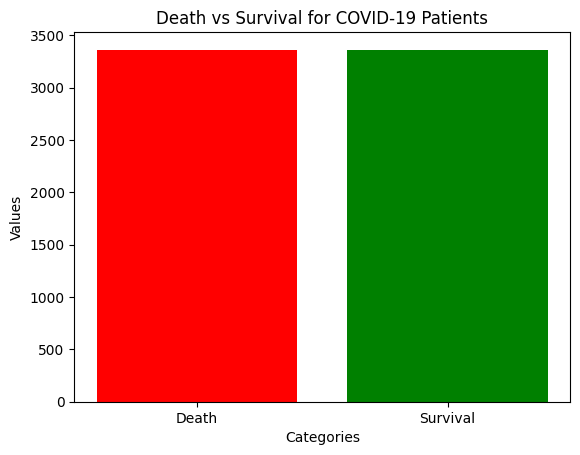

In [121]:
#check the data for balancing after undersampling

# Data
labels = ['Death', 'Survival']
values = [final_covid_df['death'].value_counts()[1], final_covid_df['death'].value_counts()[0]]

# Create a bar plot
plt.bar(labels, values, color=['red', 'green'])
plt.xlabel('Categories')
plt.ylabel('Values')
plt.title('Death vs Survival for COVID-19 Patients')
plt.show()

Let's view correlations between the different features.

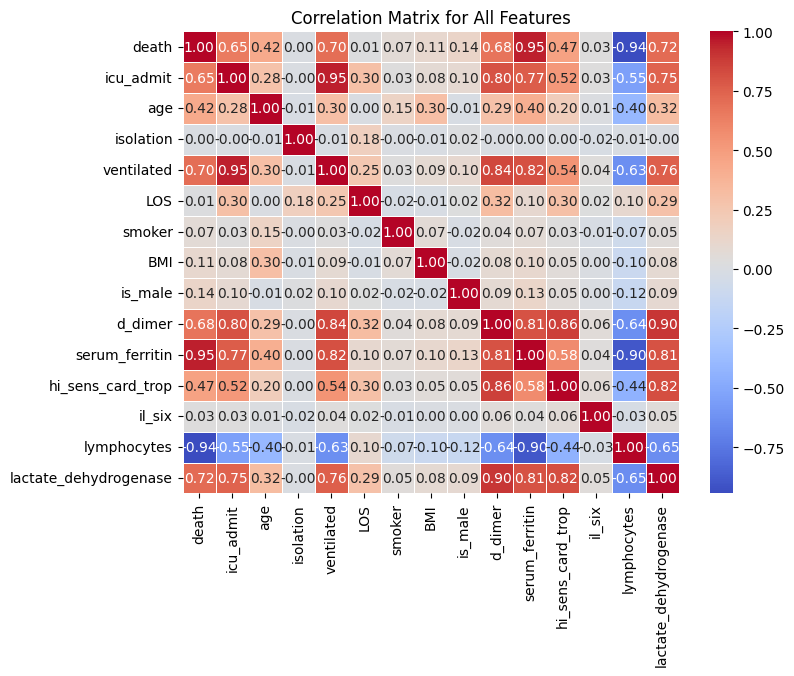

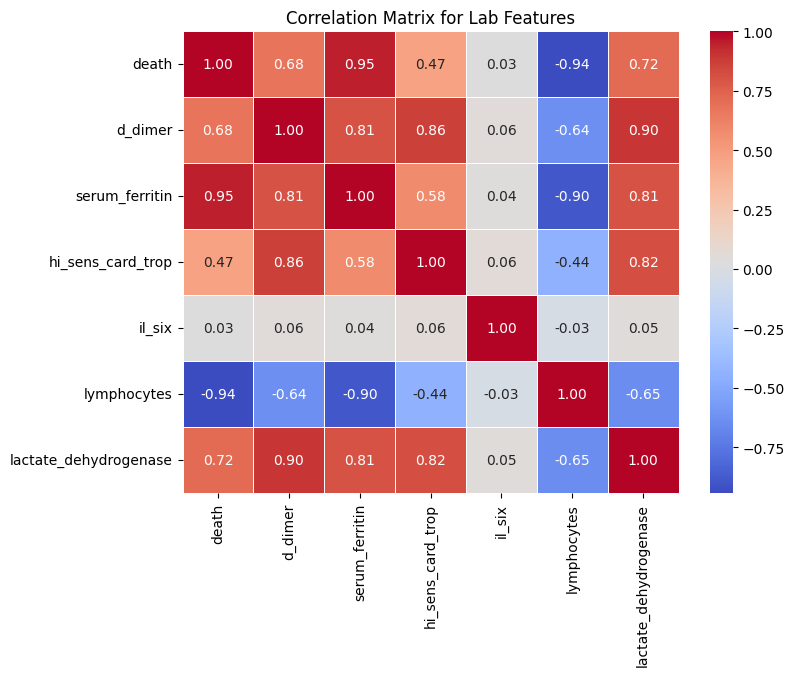

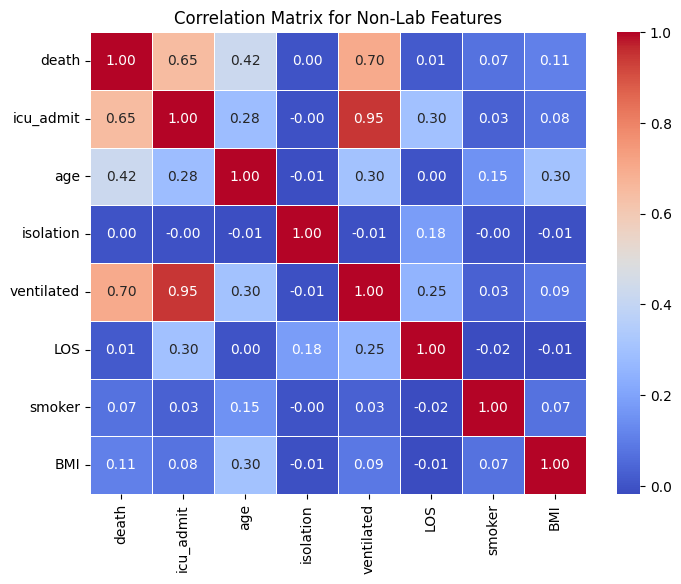

In [122]:
selected_columns = final_covid_df.iloc[:, [0] + list(range(1, len(final_covid_df.columns)))]

# Create a correlation matrix
correlation_matrix = selected_columns.corr()

# Plotting the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix for All Features')
plt.show()

print('')
selected_columns_lab = final_covid_df.iloc[:, [0] + list(range(9, len(final_covid_df.columns)))]

# Create a correlation matrix
correlation_matrix = selected_columns_lab.corr()

# Plotting the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix for Lab Features')
plt.show()

print('')
selected_columns_nl = final_covid_df.iloc[:, [0] + list(range(1, 8))]

# Create a correlation matrix
correlation_matrix = selected_columns_nl.corr()

# Plotting the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix for Non-Lab Features')
plt.show()

Recall that low lymphocytes factor in mortality prediction so the negative correlations are sensible. Adjusting for this, we see that the lab results are generally highly correlated with each other and with mortality while the non-lab features generally see lower correlation with each other and with mortality.

In [133]:
#We will create a second dataframe that drops the lab results

nonlab_final_covid_df = final_covid_df.copy()

#Clean up and drop unnecessary columns
nonlab_final_covid_df = nonlab_final_covid_df.drop(columns=['d_dimer'])
nonlab_final_covid_df = nonlab_final_covid_df.drop(columns=['serum_ferritin'])
nonlab_final_covid_df = nonlab_final_covid_df.drop(columns=['hi_sens_card_trop'])
nonlab_final_covid_df = nonlab_final_covid_df.drop(columns=['il_six'])
nonlab_final_covid_df = nonlab_final_covid_df.drop(columns=['lymphocytes'])
nonlab_final_covid_df = nonlab_final_covid_df.drop(columns=['lactate_dehydrogenase'])

nonlab_final_covid_df.head(2)

,death,icu_admit,age,isolation,ventilated,LOS,smoker,BMI,is_male
0,0,0,65.431674,0,0,13.0,0.0,27,0
1,1,1,73.016438,0,1,15.0,0.5,27,0


In [134]:
#Let's define the target variable and feature variables

#Full dataframe
#Target
Y = final_covid_df['death']
#Features
X = final_covid_df.drop(columns=['death'])

#Non-lab result dataframe
#Target
Y_nl = nonlab_final_covid_df['death']
#Features
X_nl = nonlab_final_covid_df.drop(columns=['death'])


Now we have our dataframes for analysis.

Quick Data Visualization: Mortality as a function of individual features, including a regression line to get as a complement to the correlations shown above.

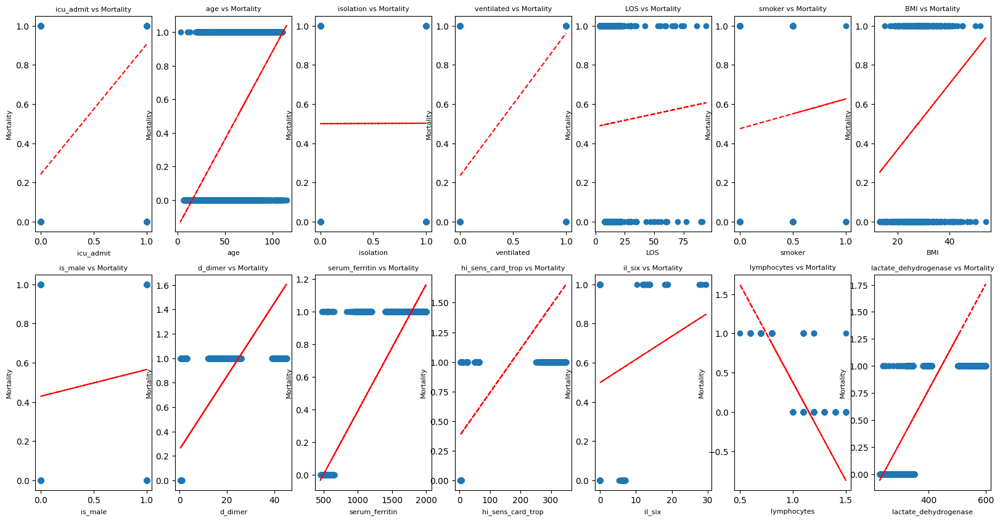

In [135]:
feature_names = list(X.columns)
num_rows, num_columns = X.shape
ncols = 7
nrows = int(np.ceil(num_columns / ncols))

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 10))

# Set the font size (adjust as needed
font_size = 8

for i, (ax, col) in enumerate(zip(axs.flat, feature_names)):
    x = X.iloc[:,i]
    pf = np.polyfit(x, Y, 1)
    p = np.poly1d(pf)

    ax.plot(x, Y, 'o')
    ax.plot(x, p(x),"r--")

    ax.set_title(col + ' vs Mortality', fontsize=font_size)
    ax.set_xlabel(col, fontsize=font_size)
    ax.set_ylabel('Mortality', fontsize=font_size)

#Machine Learning Modeling

Imports

In [126]:
#Imports
from numpy import mean
from numpy import std

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score, RocCurveDisplay, f1_score, log_loss

from sklearn.datasets import make_classification

from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

!pip install xgboost
from xgboost import XGBClassifier

!pip install catboost
from catboost import CatBoostClassifier


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 7.8 MB/s eta 0:00:00


Splitting the dataset for use in our machine learning models

In [136]:
# A common approach to splitting is to use a 70-15-15 split, where:
#     70% of the data is allocated to the training set for model training.
#     15% of the data is allocated to the validation set for hyperparameter tuning and model evaluation during training.
#     15% of the data is allocated to the test set for final model evaluation.

#Split the full dataframe into a training set of 70% and validation and test sets of 15% each
test_size = 0.30
seed = 0
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    Y,
                                                    test_size = test_size,
                                                    random_state = seed)

#Split test data equally into validation and test sets
X_valid = X_test.sample(frac = 0.5, random_state=seed)
X_test  = X_test.drop(X_valid.index)
y_valid = y_test.sample(frac = 0.5, random_state=seed)
y_test  = y_test.drop(y_valid.index)

# Show the results of the split
print("Training set has {} samples.".format(X_train.shape[0]))
print("Testing set has {} samples.".format(X_test.shape[0]))
print("Validation set has {} samples.".format(X_valid.shape[0]))

#Split the non-lab dataframe into a training set of 70% and validation and test sets of 15% each
X_nl_train, X_nl_test, y_nl_train, y_nl_test = train_test_split(X_nl,
                                                    Y_nl,
                                                    test_size = test_size,
                                                    random_state = seed)

#Split test data equally into validation and test sets
X_nl_valid = X_nl_test.sample(frac = 0.5, random_state=seed)
X_nl_test  = X_nl_test.drop(X_nl_valid.index)
y_nl_valid = y_nl_test.sample(frac = 0.5, random_state=seed)
y_nl_test  = y_nl_test.drop(y_nl_valid.index)

# Show the results of the split
print('')
print("Non-lab Training set has {} samples.".format(X_nl_train.shape[0]))
print("Non-lab Testing set has {} samples.".format(X_nl_test.shape[0]))
print("Non-lab Validation set has {} samples.".format(X_nl_valid.shape[0]))

Training set has 4708 samples.
Testing set has 1009 samples.
Validation set has 1009 samples.

Non-lab Training set has 4708 samples.
Non-lab Testing set has 1009 samples.
Non-lab Validation set has 1009 samples.


While the referenced paper uses XGBoost, we will test a number of different models to determine their relative effectiveness and use the best model for ongoing analysis.

In [137]:
# Models for comparison
models = [SGDClassifier(loss='log_loss', random_state = 0),
          GradientBoostingClassifier(random_state = 0),
          LogisticRegression(max_iter=10000, solver='saga'),
          KNeighborsClassifier(),
          RandomForestClassifier(random_state = 0),
          SVC(probability=True),
          XGBClassifier(),
          CatBoostClassifier(verbose=0)]

results = {}
print('Full Data Set')

for model in models:

    # Instantiate and fit Classification Model
    reg_model = model
    reg_model.fit(X_train, y_train)

    # Make predictions with model
    y_test_prob = reg_model.predict_proba(X_test)[:,1]

    # Grab model name and store results associated with model
    name = str(model).split("(")[0]

    results[name] = roc_auc_score(y_test, y_test_prob)*100
    print('{} done.'.format(name))

results_nl = {}
print('')
print('Non-lab Data Set')

for model in models:

    # Instantiate and fit Classification Model
    reg_model_nl = model
    reg_model_nl.fit(X_nl_train, y_nl_train)

    # Make predictions with model
    y_test_prob_nl = reg_model_nl.predict_proba(X_nl_test)[:,1]

    # Grab model name and store results associated with model
    name = str(model).split("(")[0]

    results_nl[name] = roc_auc_score(y_nl_test, y_test_prob_nl)*100
    print('{} done.'.format(name))

Full Data Set
SGDClassifier done.
GradientBoostingClassifier done.
LogisticRegression done.
KNeighborsClassifier done.
RandomForestClassifier done.
SVC done.
XGBClassifier done.
<catboost.core.CatBoostClassifier object at 0x7c39d8835930> done.

Non-lab Data Set
SGDClassifier done.
GradientBoostingClassifier done.
LogisticRegression done.
KNeighborsClassifier done.
RandomForestClassifier done.
SVC done.
XGBClassifier done.
<catboost.core.CatBoostClassifier object at 0x7c39d8835930> done.


Text(0.5, 1.0, 'Comparison of Classification Models using Non-lab Data')

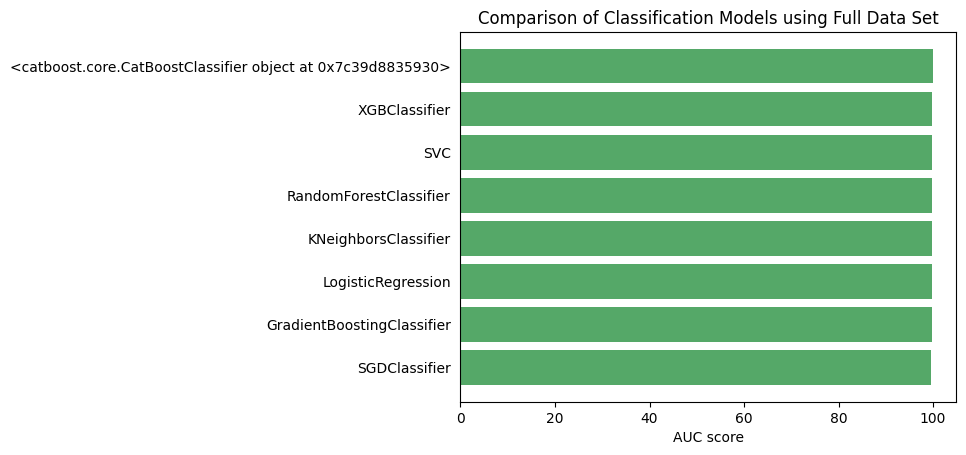

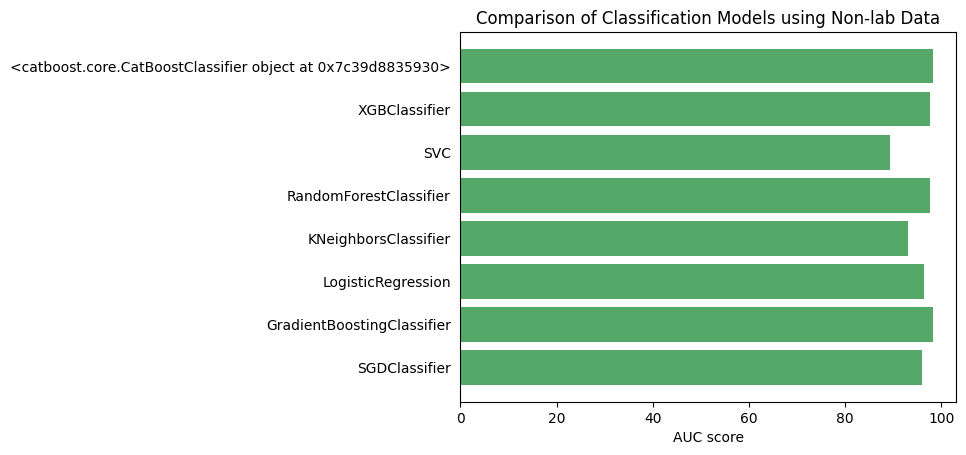

In [138]:
# AUC score results
fig, ax = plt.subplots()
ind = range(len(results))
ax.barh(ind, list(results.values()), align='center',
        color = '#55a868', alpha=1.0)
ax.set_yticks(ind)
ax.set_yticklabels(results.keys())
ax.set_xlabel('AUC score')
ax.tick_params(left=False, top=False, right=False)
ax.set_title('Comparison of Classification Models using Full Data Set')

# AUC score results for non-lab data
fig, ax = plt.subplots()
ind = range(len(results_nl))
ax.barh(ind, list(results_nl.values()), align='center',
        color = '#55a868', alpha=1.0)
ax.set_yticks(ind)
ax.set_yticklabels(results_nl.keys())
ax.set_xlabel('AUC score')
ax.tick_params(left=False, top=False, right=False)
ax.set_title('Comparison of Classification Models using Non-lab Data')

In [139]:
#sort the results by AUC score with the highest score being desirable to determine the model to use.
sorted_results = sorted(results.items(), key=lambda x: x[1], reverse=True)
print("The {} model generates the highest AUC score on the full dataset.".format(sorted_results[0][0]))
print("The model generates an AUC score of {:.2f}%.".format(sorted_results[0][1]))

print('')
sorted_results_nl = sorted(results_nl.items(), key=lambda x: x[1], reverse=True)
print("The {} model generates the highest AUC score on non-lab dataset.".format(sorted_results_nl[0][0]))
print("The model generates an AUC score of {:.2f}%.".format(sorted_results_nl[0][1]))

# Filter the results to find the value for "XGB"
xgb_result = next((result_value for result_name, result_value in sorted_results if result_name == "XGBClassifier"), None)
xgb_result_nl = next((result_value for result_name, result_value in sorted_results_nl if result_name == "XGBClassifier"), None)
print('')
print("The XGBClassifier model generates an AUC score of {:.2f}% on the full dataset.".format(xgb_result))
print("The XGBClassifier model generates an AUC score of {:.2f}% on the non-lab dataset.".format(xgb_result_nl))

print('')
print('For consistency with the research paper, we will use the XGBClassifier model, noting that its AUC is consistent with that of the optimal models.')


The <catboost.core.CatBoostClassifier object at 0x7c39d8835930> model generates the highest AUC score on the full dataset.
The model generates an AUC score of 99.96%.

The <catboost.core.CatBoostClassifier object at 0x7c39d8835930> model generates the highest AUC score on non-lab dataset.
The model generates an AUC score of 98.23%.

The XGBClassifier model generates an AUC score of 99.85% on the full dataset.
The XGBClassifier model generates an AUC score of 97.73% on the non-lab dataset.

For consistency with the research paper, we will use the XGBClassifier model, noting that its AUC is consistent with that of the optimal models.


Some useful functions for model analysis and evaluation

In [140]:
from sklearn.metrics import multilabel_confusion_matrix

#When analyzing the performance of a machine learning model, it is important to consider certain metrics:
#We will use the multi-label confusion matrix which is used for evaluating the performance of a machine learning model.
#tn = True Negative; tp = True Positive; fn = False Negative; fp = False Positive

#Let's create a number of useful functions to calculate metrics to assess the efficacy of our machine learning model.

def calc_accuracy(y_actual, y_pred):
  y_true = np.array(y_actual)
  y_pred = y_pred
  mcm = multilabel_confusion_matrix(y_true, y_pred)
  tn = mcm[:, 0, 0]
  tp = mcm[:, 1, 1]
  fn = mcm[:, 1, 0]
  fp = mcm[:, 0, 1]
  accuracy = (tp + tn) / (tp + fp + tn + fn)
  return accuracy[0]

def calc_recall(y_actual, y_pred):
  y_true = np.array(y_actual)
  y_pred = y_pred
  mcm = multilabel_confusion_matrix(y_true, y_pred)
  tn = mcm[:, 0, 0]
  tp = mcm[:, 1, 1]
  fn = mcm[:, 1, 0]
  fp = mcm[:, 0, 1]
  recall = tp / (tp + fn)
  return recall[0]

def calc_specificity(y_actual, y_pred):
  y_true = np.array(y_actual)
  y_pred = y_pred
  mcm = multilabel_confusion_matrix(y_true, y_pred)
  tn = mcm[:, 0, 0]
  tp = mcm[:, 1, 1]
  fn = mcm[:, 1, 0]
  fp = mcm[:, 0, 1]
  specificity = tn / (tn + fp)
  return specificity[0]

def calc_fallout(y_actual, y_pred):
  y_true = np.array(y_actual)
  y_pred = y_pred
  mcm = multilabel_confusion_matrix(y_true, y_pred)
  tn = mcm[:, 0, 0]
  tp = mcm[:, 1, 1]
  fn = mcm[:, 1, 0]
  fp = mcm[:, 0, 1]
  fallout = fp / (fp + tn)
  return fallout[0]

def calc_missrate(y_actual, y_pred):
  y_true = np.array(y_actual)
  y_pred = y_pred
  mcm = multilabel_confusion_matrix(y_true, y_pred)
  tn = mcm[:, 0, 0]
  tp = mcm[:, 1, 1]
  fn = mcm[:, 1, 0]
  fp = mcm[:, 0, 1]
  missrate = fn / (fn + tp)
  return missrate[0]

def calc_precision(y_actual, y_pred):
  y_true = np.array(y_actual)
  y_pred = y_pred
  mcm = multilabel_confusion_matrix(y_true, y_pred)
  tn = mcm[:, 0, 0]
  tp = mcm[:, 1, 1]
  fn = mcm[:, 1, 0]
  fp = mcm[:, 0, 1]
  precision = tp / (tp + fp)
  return precision[0]

In [141]:
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import brier_score_loss

#We will use the XGB model
model = XGBClassifier()
model.fit(X_train, y_train)

model_nl = XGBClassifier()
model_nl.fit(X_nl_train, y_nl_train)

#Make predictions using the model

#For AUC, we need to predict the probabilities
y_valid_prob   = model.predict_proba(X_valid)[:,1]
y_nl_valid_prob   = model_nl.predict_proba(X_nl_valid)[:,1]

print('Characteristics are based on the validation set')
print('')

print('Model AUC')
print('Full Data Set:      %.2f%%'%(roc_auc_score(y_valid, y_valid_prob)*100))
print('Non-lab Data Set:   %.2f%%'%(roc_auc_score(y_nl_valid, y_nl_valid_prob)*100))
print('')

print('Model AUPRC')
print('Full Data Set:      %.2f%%'%(average_precision_score(y_valid, y_valid_prob)*100))
print('Non-lab Data Set:   %.2f%%'%(average_precision_score(y_nl_valid, y_nl_valid_prob)*100))
print('')

#For characteristics, we need to make predictions, not probabilities
y_valid_preds = model.predict(X_valid)
y_nl_valid_preds = model_nl.predict(X_nl_valid)

print("F1 Score")
print('Full Data Set:      %.2f%%'%(f1_score(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(f1_score(y_nl_valid, y_nl_valid_preds)*100))
print('')

print("Log-Loss (Cross-Entropy)")
print('Full Data Set:     ', round(log_loss(y_valid, y_valid_preds), 2))
print('Non-lab Data Set:  ', round(log_loss(y_nl_valid, y_nl_valid_preds), 2))
print('')

print('Cohen Kappa')
print('Full Data Set:      %.2f%%'%(cohen_kappa_score(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(cohen_kappa_score(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Matthew Correlation Coefficient')
print('Full Data Set:      %.2f%%'%(matthews_corrcoef(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(matthews_corrcoef(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Brier Score')
print('Full Data Set:      %.2f%%'%(brier_score_loss(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(brier_score_loss(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Model Accuracy')
print('Full Data Set:      %.2f%%'%(calc_accuracy(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(calc_accuracy(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Recall: True Positive')
print('Full Data Set:      %.2f%%'%(calc_recall(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(calc_recall(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Specificity: True Negative')
print('Full Data Set:      %.2f%%'%(calc_specificity(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(calc_specificity(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Fall Out: False Positive')
print('Full Data Set:      %.2f%%'%(calc_fallout(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(calc_fallout(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Miss Rate: False Negative')
print('Full Data Set:      %.2f%%'%(calc_missrate(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(calc_missrate(y_nl_valid, y_nl_valid_preds)*100))
print('')

print('Precision: Positive Results Relative to Predicted Positive Results')
print('Full Data Set:      %.2f%%'%(calc_precision(y_valid, y_valid_preds)*100))
print('Non-lab Data Set:   %.2f%%'%(calc_precision(y_nl_valid, y_nl_valid_preds)*100))
print('')

Characteristics are based on the validation set

Model AUC
Full Data Set:      99.87%
Non-lab Data Set:   97.32%

Model AUPRC
Full Data Set:      99.91%
Non-lab Data Set:   97.24%

F1 Score
Full Data Set:      99.71%
Non-lab Data Set:   92.54%

Log-Loss (Cross-Entropy)
Full Data Set:      0.11
Non-lab Data Set:   2.68

Cohen Kappa
Full Data Set:      99.41%
Non-lab Data Set:   85.14%

Matthew Correlation Coefficient
Full Data Set:      99.41%
Non-lab Data Set:   85.19%

Brier Score
Full Data Set:      0.30%
Non-lab Data Set:   7.43%

Model Accuracy
Full Data Set:      99.70%
Non-lab Data Set:   92.57%

Recall: True Positive
Full Data Set:      100.00%
Non-lab Data Set:   94.18%

Specificity: True Negative
Full Data Set:      99.41%
Non-lab Data Set:   91.00%

Fall Out: False Positive
Full Data Set:      0.59%
Non-lab Data Set:   9.00%

Miss Rate: False Negative
Full Data Set:      0.00%
Non-lab Data Set:   5.82%

Precision: Positive Results Relative to Predicted Positive Results
Full D

In [142]:
#Model Classification Reports on the Validation Set
from sklearn.metrics import classification_report

print('Classification Report for the Full Data Set')
target_names = ['Survival', 'Death']
print(classification_report(y_valid, y_valid_preds, target_names=target_names))
print('')
print('Classification Report for the Non-lab Data Set')
target_names = ['Survival', 'Death']
print(classification_report(y_nl_valid, y_nl_valid_preds, target_names=target_names))

Classification Report for the Full Data Set
              precision    recall  f1-score   support

    Survival       0.99      1.00      1.00       498
       Death       1.00      0.99      1.00       511

    accuracy                           1.00      1009
   macro avg       1.00      1.00      1.00      1009
weighted avg       1.00      1.00      1.00      1009


Classification Report for the Non-lab Data Set
              precision    recall  f1-score   support

    Survival       0.91      0.94      0.93       498
       Death       0.94      0.91      0.93       511

    accuracy                           0.93      1009
   macro avg       0.93      0.93      0.93      1009
weighted avg       0.93      0.93      0.93      1009



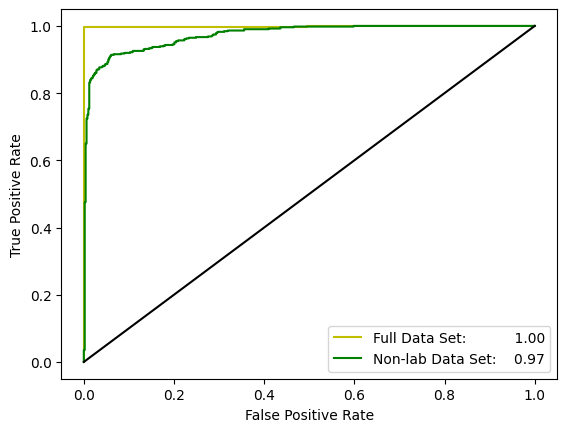

In [143]:
#Plot the ROC Curves - ensure to use the predicted probabilities and not the predicted values
auc_valid = roc_auc_score(y_valid, y_valid_prob)
auc_nl_valid = roc_auc_score(y_nl_valid, y_nl_valid_prob)

fpr_valid, tpr_valid, thresholds_valid = roc_curve(y_valid, y_valid_prob)
fpr_nl_valid, tpr_nl_valid, thresholds_nl_valid = roc_curve(y_nl_valid, y_nl_valid_prob)

plt.plot(fpr_valid, tpr_valid,'y-', label =   'Full Data Set:           %.2f'%auc_valid)
plt.plot(fpr_nl_valid, tpr_nl_valid,'g-', label = 'Non-lab Data Set:    %.2f'%auc_nl_valid)
plt.plot([0,1],[0,1],'-k')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

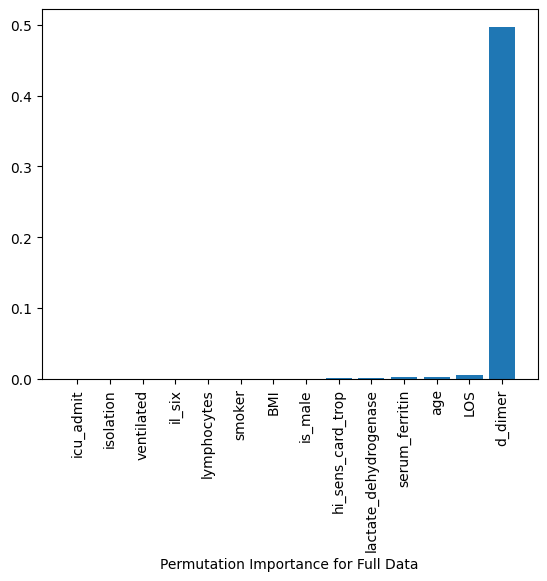

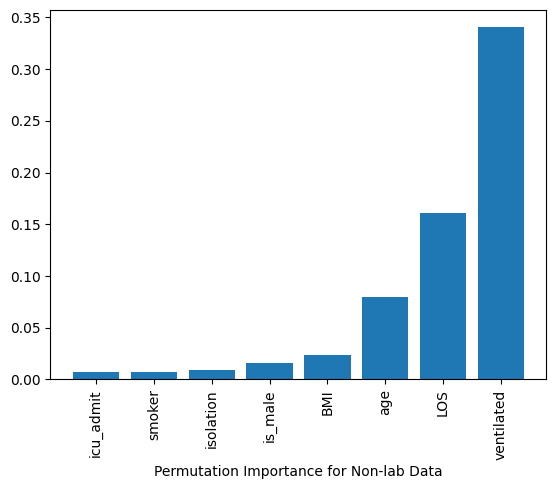

In [144]:
#Feature selection
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(model, X_train, y_train)
sorted_idx = perm_importance.importances_mean.argsort()
plt.bar(X.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance for Full Data")
plt.xticks(rotation=90)
plt.show()

print('')
print('')

perm_importance_nl = permutation_importance(model_nl, X_nl_train, y_nl_train)
sorted_idx_nl = perm_importance_nl.importances_mean.argsort()
plt.bar(X_nl.columns[sorted_idx_nl], perm_importance_nl.importances_mean[sorted_idx_nl])
plt.xlabel("Permutation Importance for Non-lab Data")
plt.xticks(rotation=90)
plt.show()

The model on the full data set has near-perfect forecasting ability which could raise some concern. Noting that the lab results are highly correlated with each other and with mortality, one could presume that dropping any single lab item would not materially impact the forecasting ability.

As such, when we look at various implementations of Explainable AI (XAI), we will use the model based on the non-lab items. Qualitatively, one could look at this model as one which has the most data available upon hospital admission as the lab results may take some time to complete. The non-lab feature model thus is a good snapshot at inception of patient admission to the hospital.

#Explainable AI to better understand the workings of the machine learning model

##Explainable AI with Shapley

SHAP (SHapley Additive exPlanations): SHAP is a popular library for explaining individual predictions of machine learning models. It computes Shapley values, a method from cooperative game theory, to explain the contribution of each feature to the model's output.

In [145]:
!pip install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 3.6 MB/s eta 0:00:00


By default a SHAP bar plot will take the mean absolute value of each feature over all the instances (rows) of the dataset.

 97%|=================== | 6545/6726 [00:23<00:00]       

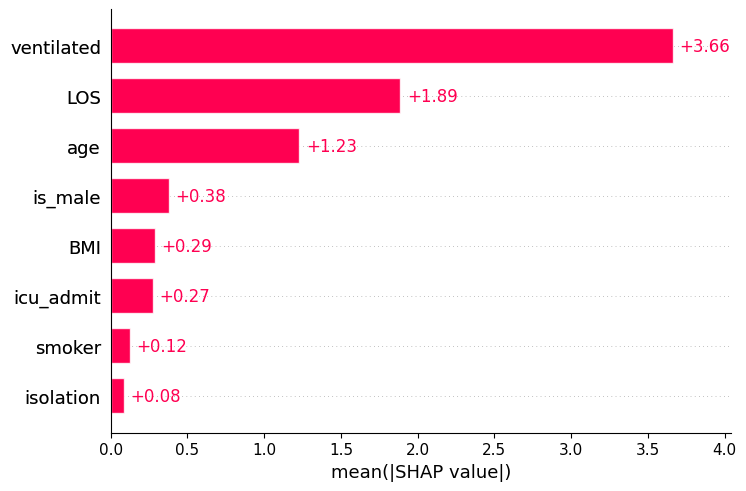

In [146]:
explainer_nl = shap.Explainer(model_nl, X_nl)
shap_values_nl = explainer_nl(X_nl)

plt.figure(figsize=(10, 6))
shap.plots.bar(shap_values_nl)

plt.show()

The mean absolute value is not the only way to create a global measure of feature importance, we can use any number of transforms. Here we show how using the max absolute value highlights the Capital Gain and Capital Loss features, since they have infrequent but high magnitude effects.

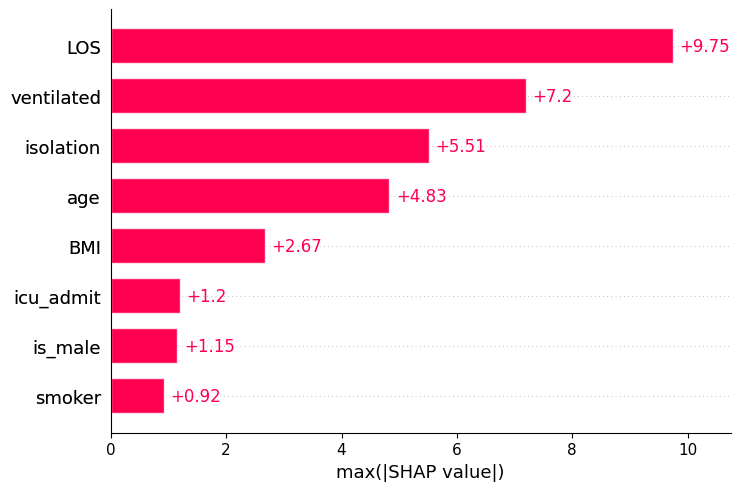

In [147]:
plt.figure(figsize=(10, 6))
shap.plots.bar(shap_values_nl.abs.max(0))

plt.show()

/usr/local/lib/python3.10/dist-packages/shap/utils/_clustering.py:126: UserWarning:

No/low signal found from feature 2 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).



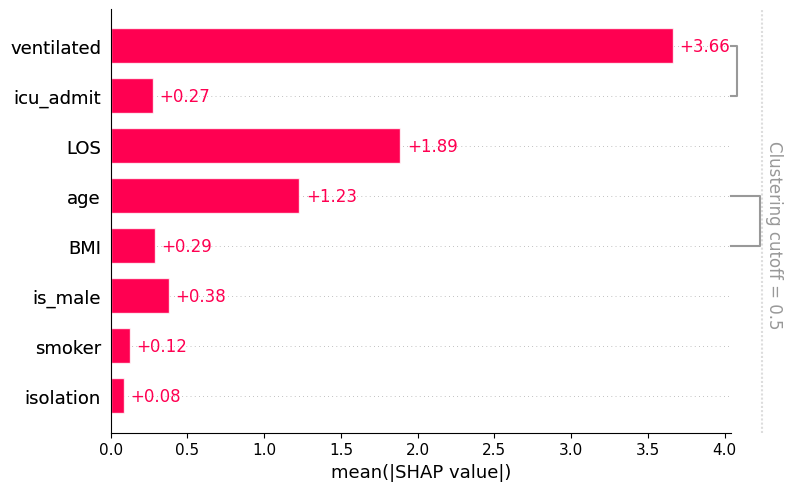

In [148]:
#Let's look at any correlated features
clustering_nl = shap.utils.hclust(X_nl, Y_nl)
shap.plots.bar(shap_values_nl, clustering=clustering_nl)

We can use a beeswarm plot to show the distribution of SHAP values for each feature across different samples in the dataset.

To interpret a beeswarm plot in SHAP, follow these steps:

Identify Features: Each vertical line in the plot represents a feature in your dataset. Look at the feature labels on the y-axis to identify which features are being displayed.

Distribution of SHAP Values: Each dot along a feature's line represents a single observation (sample) in your dataset. The position of the dot on the x-axis corresponds to the SHAP value for that feature and sample.

Impact on Prediction: Dots to the right of the center line indicate positive SHAP values, meaning they increase the model's prediction. Dots to the left indicate negative SHAP values, decreasing the prediction.

Density: The density of dots around a particular SHAP value indicates how frequently that value occurs across samples. Denser regions suggest more common SHAP values for that feature.

Outliers: Look for outliers, which are individual observations with extreme SHAP values compared to the rest of the dataset. These outliers may represent cases where the feature has an unusually strong or weak impact on the prediction.

Feature Importance: Consider the overall pattern of SHAP values for each feature. Features with consistently high or low SHAP values across many samples are likely to be more important for the model's predictions.

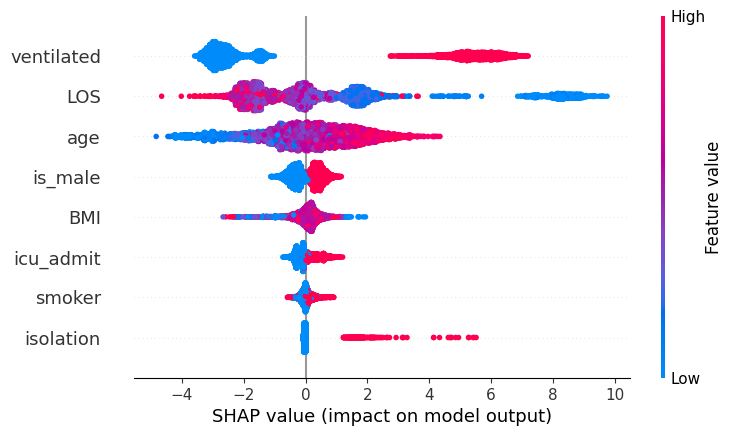

In [149]:
plt.figure(figsize=(10, 6))
shap.plots.beeswarm(shap_values_nl)

We can view a number of specific examples of local interpretation.

In [150]:
X_nl_test.head(5)

,icu_admit,age,isolation,ventilated,LOS,smoker,BMI,is_male
3266,0,85.396058,0,0,11.0,0.5,27,1
4472,1,104.402740,0,1,18.0,0.0,28,0
5571,1,85.676712,0,1,12.0,0.0,37,0
2505,0,72.113866,0,0,12.0,0.5,28,1
6142,0,44.708387,0,0,12.0,0.5,30,1


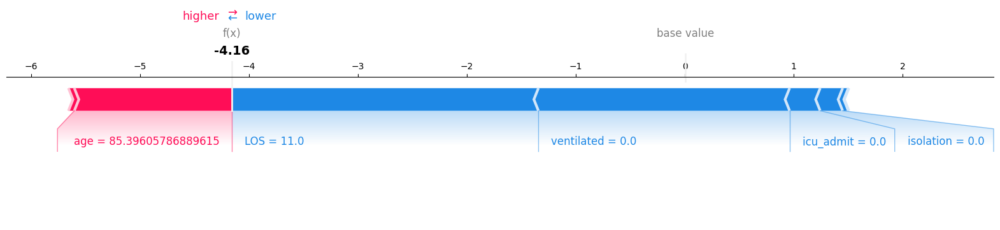

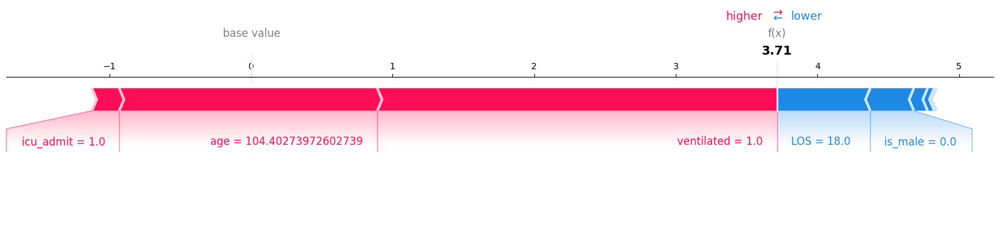

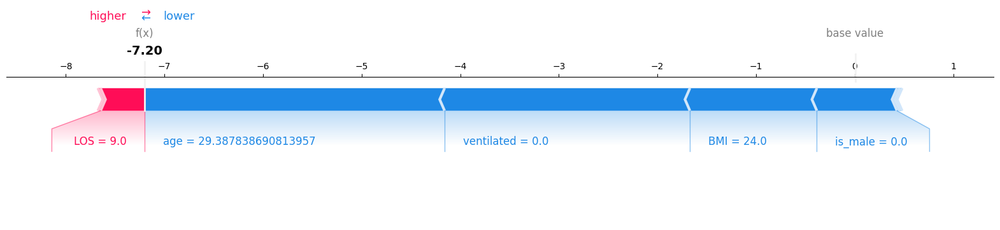

In [151]:
explainer = shap.TreeExplainer(model_nl)
shap_values = explainer.shap_values(X_nl_test)
feature_names=X_nl_test.columns.tolist()

#Select Specific Cases
selected_cases = [0, 1, 5]

#Generate Force Plot for Each Case
for case_idx in selected_cases:
    shap.force_plot(
        explainer.expected_value,
        shap_values[case_idx],
        X_nl_test.iloc[case_idx],
        feature_names=feature_names,
        matplotlib=True
    )
    plt.show()
    print("\n\n")


A SHAP waterfall plot describes the contribution of each feature to the final prediction made by a machine learning model for a specific instance. It illustrates how the predicted outcome changes as each feature's value deviates from a reference or baseline value. The plot begins with the model's base value, which is the average prediction across the dataset. Then, it shows the impact of each feature on the prediction, with bars representing the positive or negative contribution of each feature. The cumulative effect of these contributions results in the final prediction. Waterfall plots are useful for understanding the importance and directionality of individual features in the model's decision-making process for a given instance.

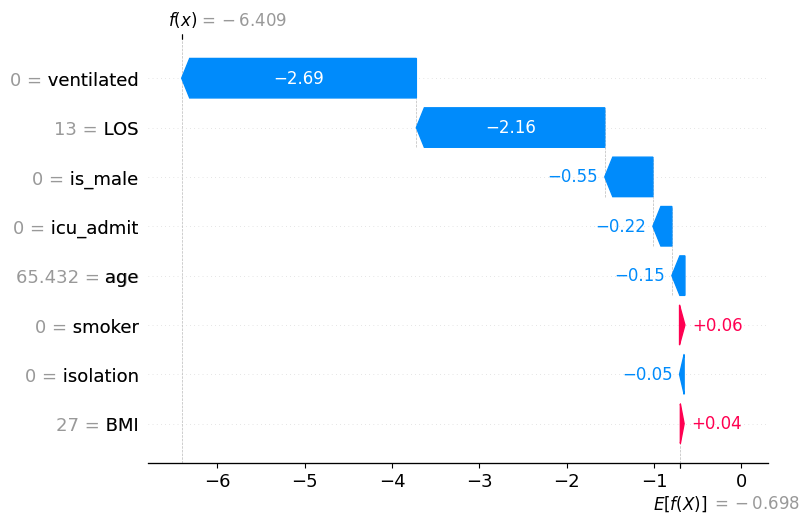

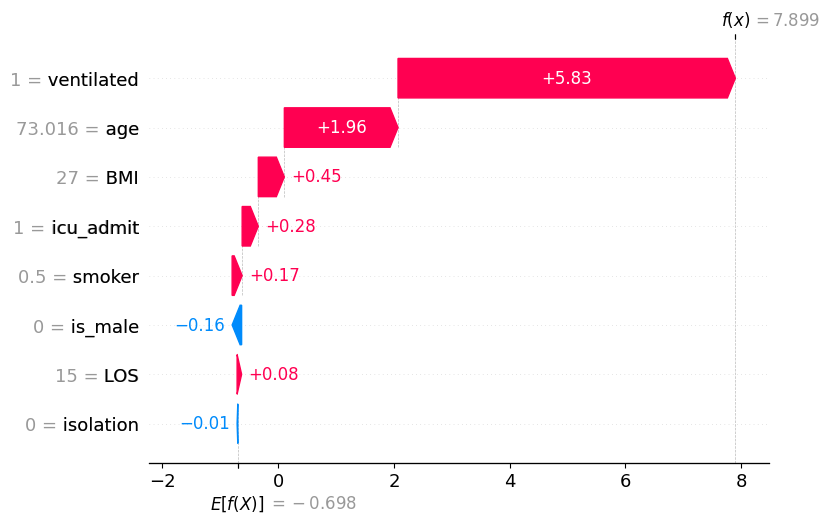

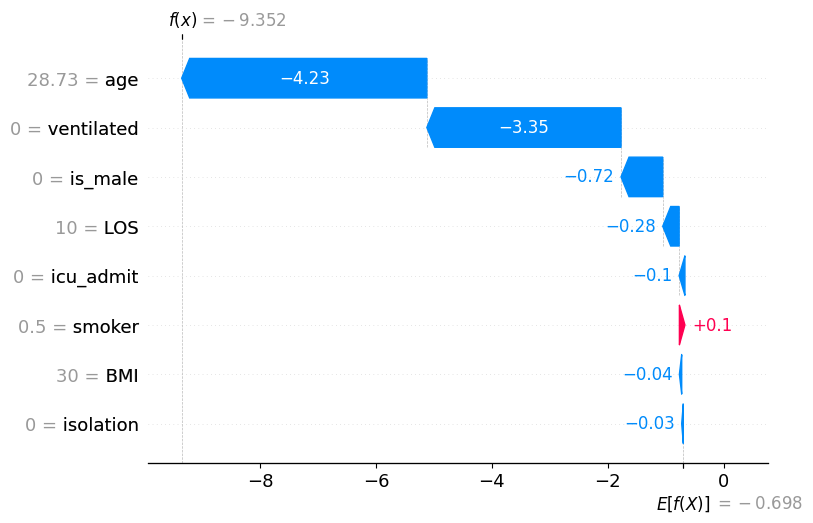

In [152]:
#Generate Waterfall Plot for a few random cases
#Define the size of the matplotlib figure

for case_idx in selected_cases:
    shap.plots.waterfall(
        shap_values_nl[case_idx]
    )
    plt.show()
    print("\n\n")


##Explainable AI with LIME

Lime (Local Interpretable Model-agnostic Explanations): Lime is another library for explaining individual predictions of machine learning models. It provides locally faithful explanations by approximating complex models with interpretable surrogate models.

In [153]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=051b2097ba60b70561d2e527f5b5748a3489b604bda9baaa666093ebe7932c7e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [154]:
from lime import lime_tabular

explainer_nl = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_nl_train),
    feature_names=X_nl_valid.columns,
    class_names=['survival', 'death'],
    mode='classification'
)

Interpretability on a single instance

In [162]:
y_nl_test.head(10)

3266    0
4472    1
5571    1
2505    0
6142    0
5114    0
3069    1
3791    1
3816    1
1386    0
Name: death, dtype: int64

In [163]:
X_nl_test.head(10)

,icu_admit,age,isolation,ventilated,LOS,smoker,BMI,is_male
3266,0,85.396058,0,0,11.0,0.5,27,1
4472,1,104.402740,0,1,18.0,0.0,28,0
5571,1,85.676712,0,1,12.0,0.0,37,0
2505,0,72.113866,0,0,12.0,0.5,28,1
6142,0,44.708387,0,0,12.0,0.5,30,1
5114,0,29.387839,0,0,9.0,0.0,24,0
3069,1,74.008219,0,0,13.0,0.5,27,0
3791,1,73.926027,0,1,11.0,0.0,30,0
3816,1,81.994521,0,1,16.0,0.0,27,1
1386,0,81.768661,0,0,14.0,0.5,29,0


In [165]:
#change reference patient for death/survival
patient_id = 9

exp_nl = explainer_nl.explain_instance(
    data_row=X_nl_test.iloc[patient_id],
    predict_fn=model_nl.predict_proba
)

exp_nl.show_in_notebook(show_table=True)

The left-most bar plot is showing us the prediction probabilities, which can be treated as the model's confidence level in making the prediction.

The second visualization is probably the most important visualization which provides maximum explainability for each of the features.

The third visualization from the left shows the features and their respective values. Here, the features highlighted in orange are contributing toward class death, while features highlighted in blue are contributing toward class survival.

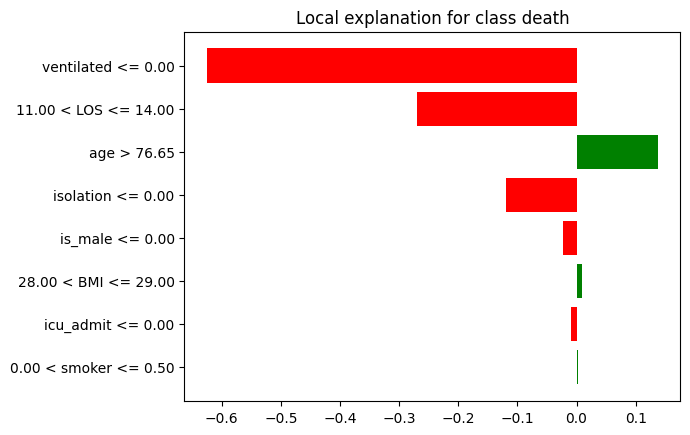

In [166]:
figure_nl = exp_nl.as_pyplot_figure(label = exp_nl.available_labels()[0])

Interpretability on a number of instances

In [168]:
# Let's use SP-LIME to return explanations on a few sample patients from the datasets and obtain a non-redundant global decision perspective of the black-box model
from lime import submodular_pick

sp_exp_nl = submodular_pick.SubmodularPick(explainer_nl,
                                        final_covid_df[X_nl_train.columns].values,
                                        predict_fn=model_nl.predict_proba,
                                        num_features=8,
                                        num_exps_desired=5)

In [169]:
print('SP-LIME Explanations on Non-lab Data Set examples.')
[exp_nl.show_in_notebook() for exp_nl in sp_exp_nl.sp_explanations]

SP-LIME Explanations on Non-lab Data Set examples.


[None, None, None, None, None]

SP-LIME Local Explanations on Non-lab Data Set


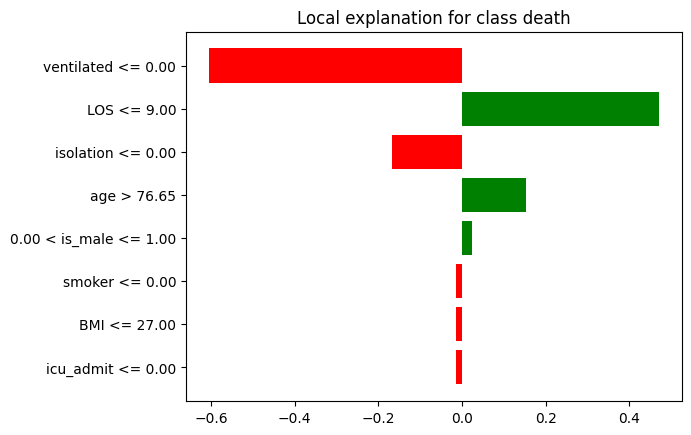

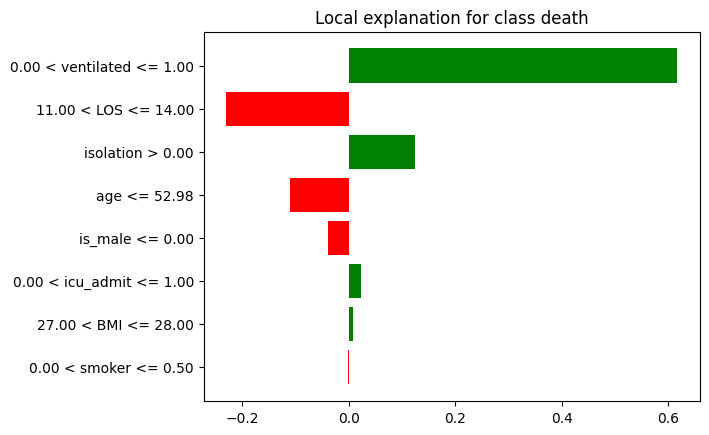

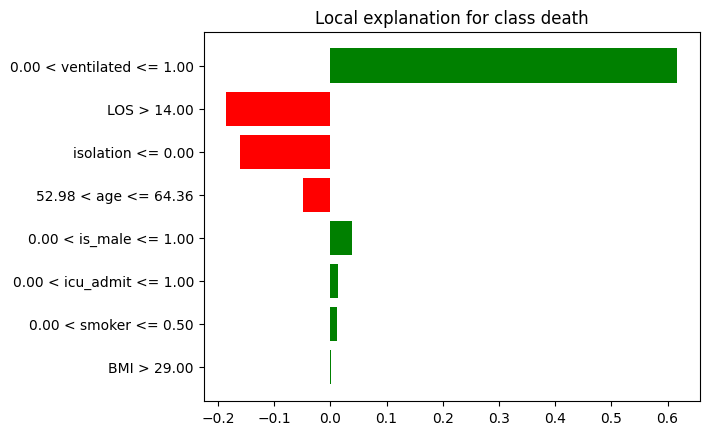

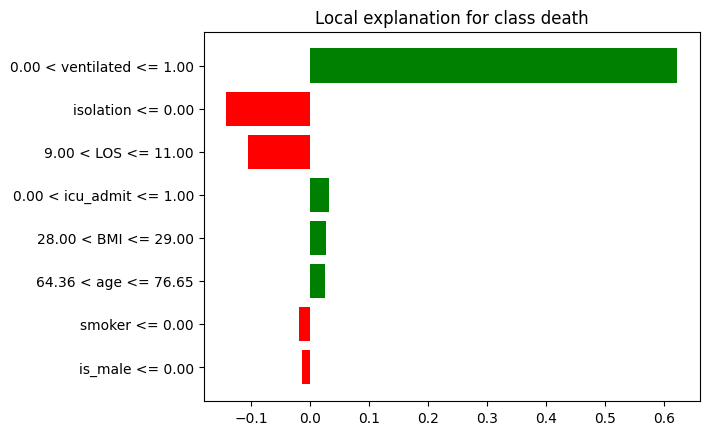

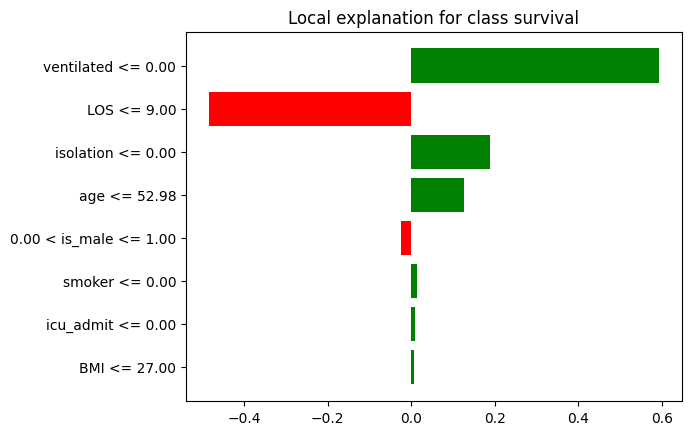

In [170]:
[exp_nl.as_pyplot_figure(label=exp_nl.available_labels()[0]) for exp_nl in sp_exp_nl.sp_explanations]
print('SP-LIME Local Explanations on Non-lab Data Set')

##Explainable AI with ELI5

ELI5 (Explain Like I'm 5): ELI5 is a library that provides explanations for machine learning models at various levels of detail, including feature importances, permutation importances, and visualization of decision trees.

In [171]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=6236b67ef234dcaa73c84106cd06883f1916d1fde12a07016b397f7b88c00ebe
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


Feature importance is a popular XAI technique that helps us understand which features are most important in a machine learning model.

In [172]:
import eli5

# Compute feature importance using ELI5
eli5.show_weights(model_nl, feature_names=list(X_nl_train.columns))

Weight,Feature
0.8423,ventilated
0.0747,LOS
0.0360,isolation
0.0118,age
0.0102,is_male
0.0091,icu_admit
0.0086,smoker
0.0071,BMI


Permutation importance is similar to feature importance, but instead of fitting a new model for each feature, it randomly permutes each feature and measures the resulting decrease in model performance. This can help us identify features that are most important to the model's performance.

In [173]:
from eli5.sklearn import PermutationImportance

# Compute permutation importance using ELI5
perm_nl = PermutationImportance(model_nl).fit(X_nl_test, y_nl_test)
eli5.show_weights(perm_nl, feature_names=list(X_nl_test.columns))

Weight,Feature
0.3471 ± 0.0308,ventilated
0.1227 ± 0.0183,LOS
0.0305 ± 0.0090,age
0.0089 ± 0.0059,isolation
0.0057 ± 0.0034,is_male
0.0040 ± 0.0013,icu_admit
0.0008 ± 0.0023,smoker
-0.0018 ± 0.0088,BMI


ELI5 also provides tools for generating textual explanations for machine learning models. Textual explanations can help us understand how a model arrived at a particular decision or prediction.

In [174]:
# Generate a textual explanation using ELI5
eli5.show_prediction(model_nl, X_nl_test.iloc[2], target_names=["survived", "died"])

##Explainable AI with InterpretML

InterpretML: InterpretML is a library developed by Microsoft Research that offers a suite of interpretability techniques, including global feature importance, local explanations, and explanations for model predictions.

In [175]:
!pip install interpret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 26.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 47.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 70.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 83.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.7/778.7 kB 53.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.3/247.3 kB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 56.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 15.8 MB/s eta 0:00:00


###Glassbox Models: Explainable Boosting Machine

Glassbox models can provide explanations on a both global (overall behavior) and local (individual predictions) level.

Global explanations are useful for understanding what a model finds important, as well as identifying potential flaws in its decision making.

Explainable Boosting Machine (EBM) is a tree-based, cyclic gradient boosting Generalized Additive Model with automatic interaction detection. This makes EBMs as accurate as state-of-the-art techniques like random forests and gradient boosted trees. However, unlike these blackbox models, EBMs produce exact explanations and are editable by domain experts.

In [176]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

ebm = ExplainableBoostingClassifier()
ebm.fit(X_nl_train, y_nl_train)

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



ExplainableBoostingClassifier()

In [177]:
#show(ebm.explain_global())
ebm_explanation = ebm.explain_global()
plotly_fig = ebm_explanation.visualize()
plotly_fig.show()


In [178]:
#show(ebm.explain_local(X_nl_test[:5], y_nl_test[:5]))
ebm_explanation = ebm.explain_local(X_nl_test[:5], y_nl_test[:5])
plotly_fig = ebm_explanation.visualize(0)
plotly_fig.show()

###Evaluate EBM performance

In [179]:
from interpret.perf import ROC

#ebm_perf = ROC(ebm).explain_perf(X_nl_test, y_nl_test, name='EBM')
#show(ebm_perf)
#plt.show(ebm_perf)

ebm_perf = ROC(ebm).explain_perf(X_nl_test, y_nl_test, name='EBM')
plotly_fig = ebm_perf.visualize()
plotly_fig.show()

In [180]:
from interpret.glassbox import ClassificationTree

tree = ClassificationTree()
tree.fit(X_nl_train, y_nl_train)
tree_global = tree.explain_global(name='Classification Tree')
show(tree_global)

#note that the rendering method show does not always run for multiple code executions

###Build a Blackbox Pipeline

Blackbox interpretability methods can extract explanations from any machine learning pipeline. This includes model ensembles, pre-processing steps, and complex models such as deep neural nets.

In [181]:
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

pca = PCA()

blackbox_model = Pipeline([('pca', pca), ('model', model_nl)])
blackbox_model.fit(X_nl_train, y_nl_train)

Pipeline(steps=[('pca', PCA()),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

###Explain the Blackbox

In [182]:
from interpret.blackbox import LimeTabular
from interpret import show

lime = LimeTabular(blackbox_model, X_nl_train, random_state=seed)
#show(lime.explain_local(X_nl_test[:5], y_nl_test[:5]), 0)

lime_explanation = lime.explain_local(X_nl_test[:5], y_nl_test[:5])
plotly_fig = lime_explanation.visualize(0)
plotly_fig.show()

#Replacing XGBoost with a Deep Learning Model and running XAI

###Converting XGBoost to Deep Learning and running XAI

In [183]:
import tensorflow as tf

In [184]:
# Define a simple neural network
model_nns = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_nl_train.shape[1],)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

In [185]:
# Compile the model
model_nns.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['AUC'])

In [186]:
x_train_tensor = tf.convert_to_tensor(X_nl_train)
y_train_tensor = tf.convert_to_tensor(model_nl.predict(X_nl_train))

# Train the neural network (using XGBoost predictions as labels)
model_nns.fit(x_train_tensor, y_train_tensor, epochs=10, batch_size=32)

Epoch 1/10
148/148 [==============================] - 1s 2ms/step - loss: 0.7354 - auc: 0.6431
Epoch 2/10
148/148 [==============================] - 0s 2ms/step - loss: 0.4692 - auc: 0.9279
Epoch 3/10
148/148 [==============================] - 0s 2ms/step - loss: 0.3516 - auc: 0.9839
Epoch 4/10
148/148 [==============================] - 0s 2ms/step - loss: 0.2791 - auc: 0.9902
Epoch 5/10
148/148 [==============================] - 0s 2ms/step - loss: 0.2184 - auc: 0.9988
Epoch 6/10
148/148 [==============================] - 0s 2ms/step - loss: 0.1844 - auc: 0.9984
Epoch 7/10
148/148 [==============================] - 0s 2ms/step - loss: 0.1522 - auc: 0.9992
Epoch 8/10
148/148 [==============================] - 0s 2ms/step - loss: 0.1280 - auc: 0.9995
Epoch 9/10
148/148 [==============================] - 0s 2ms/step - loss: 0.1074 - auc: 0.9996
Epoch 10/10
148/148 [==============================] - 0s 2ms/step - loss: 0.0903 - auc: 0.9994


In [201]:
nr, nc = X_nl_valid.shape
X_nl_valid_reshaped = X_nl_valid.values.reshape((-1, nc))
outputs = model_nns(X_nl_valid_reshaped)

#Neural network models predict continuous variables so we need to round the output
rounded_outputs = []
for output in outputs:
    if output > 0.25:
        rounded_outputs.append(1)
    else:
        rounded_outputs.append(0)

# Calculate the AUC score
results_nns = roc_auc_score(rounded_outputs, y_nl_valid)

print('Model AUC: ', results_nns)

Model AUC:  0.5967477542456232


##Explainable AI with Captum

In [202]:
#scikit-learn related imports
import sklearn
from sklearn.metrics import mean_squared_error

# pytorch relates imports
import torch
import torch.nn as nn
import torch.optim as optim

# imports from captum library
!pip install captum
import captum
from captum.attr import LayerConductance, LayerActivation, LayerIntegratedGradients
from captum.attr import IntegratedGradients, DeepLift, GradientShap, NoiseTunnel, FeatureAblation

torch.manual_seed(1234)
np.random.seed(1234)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 9.0 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

Tensorizing inputs and creating batches

In [220]:
X_nn_train = torch.tensor(X_nl_train.values).float()
y_nn_train = torch.tensor(y_nl_train.values).view(-1, 1).float()

X_nn_test = torch.tensor(X_nl_test.values).float()
y_nn_test = torch.tensor(y_nl_test.values).view(-1, 1).float()

X_nn_valid = torch.tensor(X_nl_valid.values).float()
y_nn_valid = torch.tensor(y_nl_valid.values).view(-1, 1).float()

datasets_nn = torch.utils.data.TensorDataset(X_nn_train, y_nn_train)
train_iter_nn = torch.utils.data.DataLoader(datasets_nn, batch_size=10, shuffle=True)

In [204]:
#Defining default hyper parameters for the model.
batch_size = 50
num_epochs = 200
learning_rate = 0.0001
size_hidden1 = 100
size_hidden2 = 50
size_hidden3 = 10
size_hidden4 = 1

In [205]:
#Define the new NN model
class CovidMortalityModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.lin1 = nn.Linear(len(X_nl_train.columns), size_hidden1)
        self.relu1 = nn.ReLU()
        self.lin2 = nn.Linear(size_hidden1, size_hidden2)
        self.relu2 = nn.ReLU()
        self.lin3 = nn.Linear(size_hidden2, size_hidden3)
        self.relu3 = nn.ReLU()
        self.lin4 = nn.Linear(size_hidden3, size_hidden4)

    def forward(self, input):
        return self.lin4(self.relu3(self.lin3(self.relu2(self.lin2(self.relu1(self.lin1(input)))))))

In [206]:
#Model training
model_nn = CovidMortalityModel()
model_nn.train()

CovidMortalityModel(
  (lin1): Linear(in_features=8, out_features=100, bias=True)
  (relu1): ReLU()
  (lin2): Linear(in_features=100, out_features=50, bias=True)
  (relu2): ReLU()
  (lin3): Linear(in_features=50, out_features=10, bias=True)
  (relu3): ReLU()
  (lin4): Linear(in_features=10, out_features=1, bias=True)
)

In [207]:
#Defining the loss function that will be used for optimization" Binary Cross-Entropy/Log Loss
criterion = nn.L1Loss(reduction='sum')


In [208]:
def train(model_inp, num_epochs = num_epochs):
#    optimizer = tf.optimizers.AdamW(model_inp.parameters(), learning_rate=learning_rate)
    optimizer = torch.optim.AdamW(model_inp.parameters(), lr=learning_rate)
    for epoch in range(num_epochs):  # loop over the dataset multiple times
        running_loss = 0.0
        for inputs, labels in train_iter_nn:
            # forward pass
            outputs = model_inp(inputs)
            # defining loss
            loss = criterion(outputs, labels)
            # zero the parameter gradients
            optimizer.zero_grad()
            # computing gradients
            loss.backward()
            # accumulating running loss
            running_loss += loss.item()
            # updated weights based on computed gradients
            optimizer.step()
        if epoch % 20 == 0:
            print('Epoch [%d]/[%d] running accumulative loss across all batches: %.3f' %
                  (epoch + 1, num_epochs, running_loss))
        running_loss = 0.0

In [209]:
train(model_nn)

Epoch [1]/[200] running accumulative loss across all batches: 1773.643
Epoch [21]/[200] running accumulative loss across all batches: 624.451
Epoch [41]/[200] running accumulative loss across all batches: 587.572
Epoch [61]/[200] running accumulative loss across all batches: 559.293
Epoch [81]/[200] running accumulative loss across all batches: 530.251
Epoch [101]/[200] running accumulative loss across all batches: 511.871
Epoch [121]/[200] running accumulative loss across all batches: 480.209
Epoch [141]/[200] running accumulative loss across all batches: 456.355
Epoch [161]/[200] running accumulative loss across all batches: 446.524
Epoch [181]/[200] running accumulative loss across all batches: 438.552


In [223]:
model_nn.eval()
outputs = model_nn(X_nn_test)

#Neural network models predict continuous variables so we need to round the output
rounded_outputs = []
for output in outputs:
    if output > 0.85:
        rounded_outputs.append(1)
    else:
        rounded_outputs.append(0)

# Calculate the AUC score
results_nn = roc_auc_score(rounded_outputs, y_nn_test)

print('Model AUC: ', results_nn)

Model AUC:  0.927302433298436


###Comparing different attribution algorithms

In [227]:
ig = IntegratedGradients(model_nn)
ig_nt = NoiseTunnel(ig)
dl = DeepLift(model_nn)
gs = GradientShap(model_nn)
fa = FeatureAblation(model_nn)

ig_attr_test = ig.attribute(X_nn_test, n_steps=50)
ig_nt_attr_test = ig_nt.attribute(X_nn_test)
dl_attr_test = dl.attribute(X_nn_test)
gs_attr_test = gs.attribute(X_nn_test, X_nn_train)
fa_attr_test = fa.attribute(X_nn_test)

/usr/local/lib/python3.10/dist-packages/captum/_utils/gradient.py:57: UserWarning:

Input Tensor 0 did not already require gradients, required_grads has been set automatically.

/usr/local/lib/python3.10/dist-packages/captum/attr/_core/deep_lift.py:304: UserWarning:

Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished



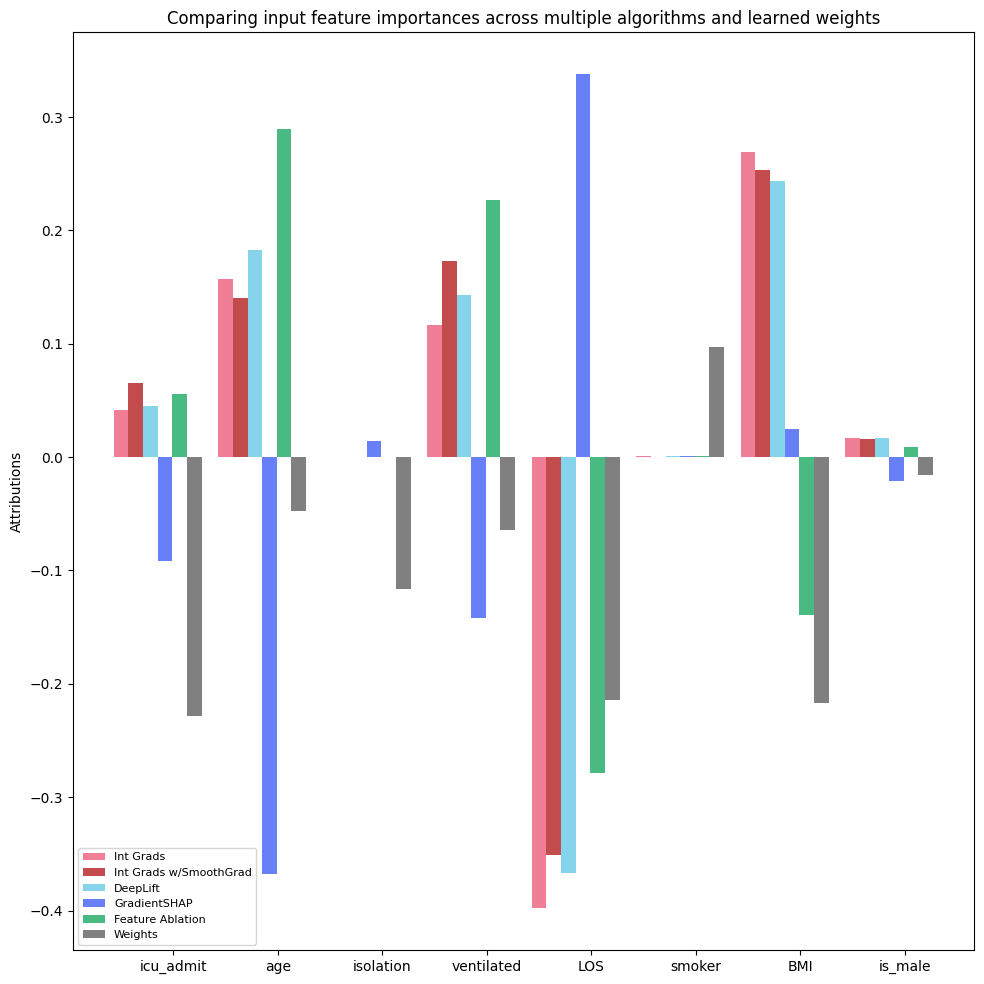

In [228]:
# prepare attributions for visualization

x_axis_data = np.arange(X_nl_test.shape[1])
x_axis_data_labels = list(map(lambda idx: feature_names[idx], x_axis_data))

ig_attr_test_sum = ig_attr_test.detach().numpy().sum(0)
ig_attr_test_norm_sum = ig_attr_test_sum / np.linalg.norm(ig_attr_test_sum, ord=1)

ig_nt_attr_test_sum = ig_nt_attr_test.detach().numpy().sum(0)
ig_nt_attr_test_norm_sum = ig_nt_attr_test_sum / np.linalg.norm(ig_nt_attr_test_sum, ord=1)

dl_attr_test_sum = dl_attr_test.detach().numpy().sum(0)
dl_attr_test_norm_sum = dl_attr_test_sum / np.linalg.norm(dl_attr_test_sum, ord=1)

gs_attr_test_sum = gs_attr_test.detach().numpy().sum(0)
gs_attr_test_norm_sum = gs_attr_test_sum / np.linalg.norm(gs_attr_test_sum, ord=1)

fa_attr_test_sum = fa_attr_test.detach().numpy().sum(0)
fa_attr_test_norm_sum = fa_attr_test_sum / np.linalg.norm(fa_attr_test_sum, ord=1)

lin_weight = model_nn.lin1.weight[0].detach().numpy()
y_axis_lin_weight = lin_weight / np.linalg.norm(lin_weight, ord=1)

width = 0.14
legends = ['Int Grads', 'Int Grads w/SmoothGrad','DeepLift', 'GradientSHAP', 'Feature Ablation', 'Weights']

plt.figure(figsize=(10, 10))

ax = plt.subplot()
ax.set_title('Comparing input feature importances across multiple algorithms and learned weights')
ax.set_ylabel('Attributions')

FONT_SIZE = 12
plt.rc('font', size=FONT_SIZE)            # fontsize of the text sizes
plt.rc('axes', titlesize=FONT_SIZE)       # fontsize of the axes title
plt.rc('axes', labelsize=FONT_SIZE)       # fontsize of the x and y labels
plt.rc('legend', fontsize=FONT_SIZE-4)    # fontsize of the legend

ax.bar(x_axis_data, ig_attr_test_norm_sum, width, align='center', alpha=0.8, color='#eb5e7c')
ax.bar(x_axis_data + width, ig_nt_attr_test_norm_sum, width, align='center', alpha=0.7, color='#A90000')
ax.bar(x_axis_data + 2 * width, dl_attr_test_norm_sum, width, align='center', alpha=0.6, color='#34b8e0')
ax.bar(x_axis_data + 3 * width, gs_attr_test_norm_sum, width, align='center',  alpha=0.8, color='#4260f5')
ax.bar(x_axis_data + 4 * width, fa_attr_test_norm_sum, width, align='center', alpha=1.0, color='#49ba81')
ax.bar(x_axis_data + 5 * width, y_axis_lin_weight, width, align='center', alpha=1.0, color='grey')
ax.autoscale_view()
plt.tight_layout()

ax.set_xticks(x_axis_data + 0.5)
ax.set_xticklabels(x_axis_data_labels)

plt.legend(legends, loc=3)
plt.show()

The magnitudes of learned model weights tell us about the correlations between the dependent variable (mortality) and each independent variable (features). Zero weight means no correlation whereas positive weights indicate positive correlations and negatives the opposite. Since the network has more than one layer these weights might not be directly correlated with mortality.

###Attributing to the layers and comparing with model weights

In [229]:
# Compute the attributions of the output with respect to the inputs of the fourth linear layer
lc = LayerConductance(model_nn, model_nn.lin4)

# shape: test_examples x size_hidden
lc_attr_test = lc.attribute(X_nn_test, n_steps=100, attribute_to_layer_input=True)

# weights from forth linear layer
# shape: size_hidden4 x size_hidden3
lin4_weight = model_nn.lin4.weight

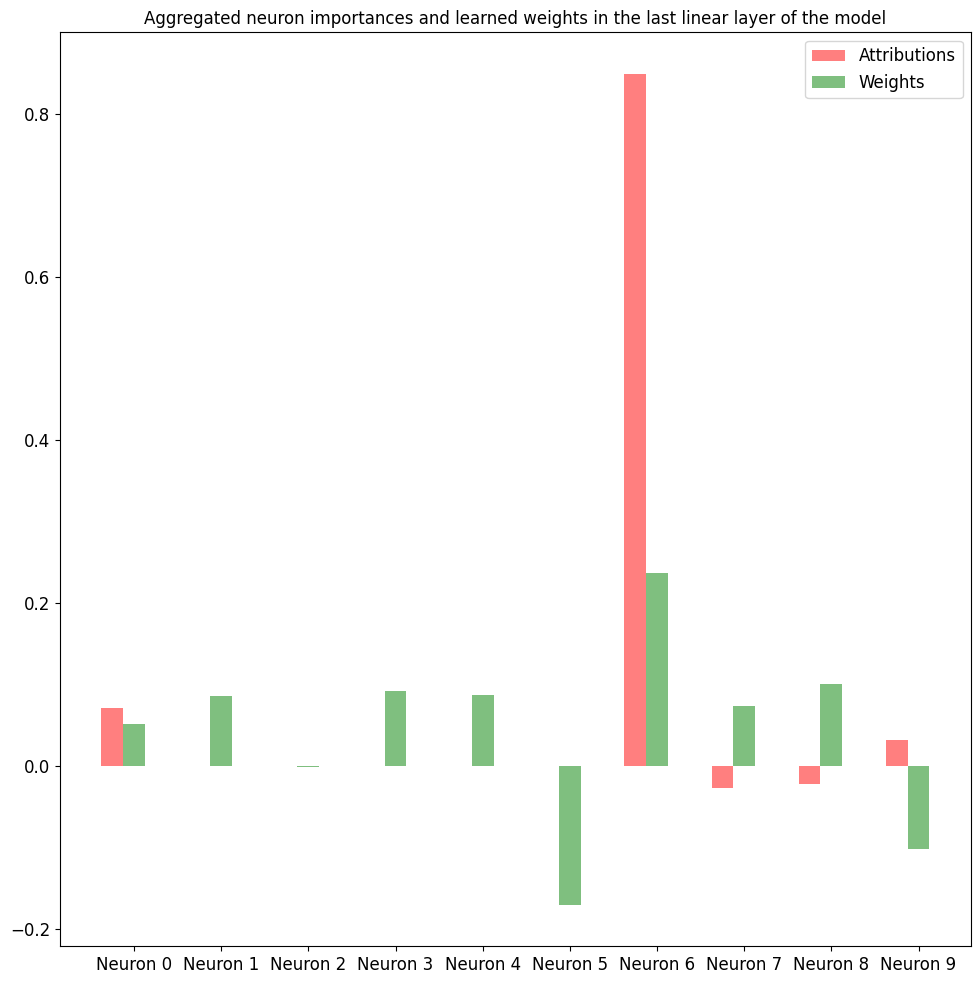

In [230]:
plt.figure(figsize=(10, 10))

x_axis_data = np.arange(lc_attr_test.shape[1])

y_axis_lc_attr_test = lc_attr_test.mean(0).detach().numpy()
y_axis_lc_attr_test = y_axis_lc_attr_test / np.linalg.norm(y_axis_lc_attr_test, ord=1)

y_axis_lin4_weight = lin4_weight[0].detach().numpy()
y_axis_lin4_weight = y_axis_lin4_weight / np.linalg.norm(y_axis_lin4_weight, ord=1)

width = 0.25
legends = ['Attributions','Weights']
x_axis_labels = [ 'Neuron {}'.format(i) for i in range(len(y_axis_lin4_weight))]

ax = plt.subplot()
ax.set_title('Aggregated neuron importances and learned weights in the last linear layer of the model')

ax.bar(x_axis_data + width, y_axis_lc_attr_test, width, align='center', alpha=0.5, color='red')
ax.bar(x_axis_data + 2 * width, y_axis_lin4_weight, width, align='center', alpha=0.5, color='green')
plt.legend(legends, loc=1, prop={'size': FONT_SIZE})
ax.autoscale_view()
plt.tight_layout()

ax.set_xticks(x_axis_data + 0.5)
ax.set_xticklabels(x_axis_labels)

plt.show()